# Business Analytics Project
Analyzing Yandex.afisha users traffic, user orders and marketing costs from June 2017 till May 2018.
The main tasks in hand is to explore the metrics and funnels, revenues and marketing expenses involved. Then, the goal would be to learn and be able to suggest how to optimize marketing expenses based on the data. 


## Description of the data
**The visits table** (server logs with data on website visits):
- Uid — user's unique identifier
- Device — user's device
- Start Ts — session start date and time
- End Ts — session end date and time
- Source Id — identifier of the ad source the user came from

**The orders** table (data on orders):
- Uid — unique identifier of the user making an order
- Buy Ts — order date and time
- Revenue — Yandex.Afisha's revenue from the order

**The costs** table (data on marketing expenses):
- source_id — ad source identifier
- dt — date
- costs — expenses on this ad source on this day


## Download the data and prepare it for analysis

In [1]:
#!pip install sidetable -U
#!pip install plotly

In [2]:
# Loading all the libraries
import pandas as pd
import numpy as np

# matplotlib for visualization
import matplotlib.pyplot as plt
%matplotlib inline
import plotly.express as px
import plotly.graph_objects as go

# seaborn for statistical data visualization
import seaborn as sns

# import stats from scipy
from scipy import stats
from scipy import stats as st

#plotly for interactive visualization

# For Transforming date and time
import time
import datetime
from datetime import datetime

# merge tables
from functools import reduce
# calculate missing users
#import sidetable
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = 'all'

import warnings
warnings.filterwarnings("ignore")

In [3]:
# Load the data file into a DataFrame
try:
    visits = pd.read_csv('C:\\Users\\udi\\Desktop\\Yandex\\Project_6\\visits_log_us.csv',
                        parse_dates=['Start Ts', 'End Ts'], dtype={'Device': 'category'})
    orders = pd.read_csv('C:\\Users\\udi\\Desktop\\Yandex\\Project_6\\orders_log_us.csv',
                        parse_dates=['Buy Ts'])
    costs = pd.read_csv('C:\\Users\\udi\\Desktop\\Yandex\\Project_6\\costs_us.csv',
                       parse_dates=['dt'])
    
except:

    visits = pd.read_csv('/datasets/visits_log_us.csv',
                        parse_dates=['Start Ts', 'End Ts'], dtype={'Device': 'category'})
    orders = pd.read_csv('/datasets/orders_log_us.csv',
                        parse_dates=['Buy Ts'])
    costs = pd.read_csv('/datasets/costs_us.csv',
                       parse_dates=['dt'])


print('Data has been read correctly!')

Data has been read correctly!


I changed data types in all 3 files loading to make the process a bit more efficient as the visits file was big and would have slowed the rest of the process otherwise.

In [4]:
df_list = [visits, orders, costs]
for df in df_list:
    df.columns=[col.lower().replace(' ','_') for col in df.columns]

No missing data and the datatypes are converted and I lowered column title case for convenience.

In [5]:
df_table = [visits, orders, costs]
for df in df_table:
    df.info()
    df.describe(include= 'all')
    df.head()
    df.tail()
    print('---------------------------------------------------------------------------')
    print()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 359400 entries, 0 to 359399
Data columns (total 5 columns):
 #   Column     Non-Null Count   Dtype         
---  ------     --------------   -----         
 0   device     359400 non-null  category      
 1   end_ts     359400 non-null  datetime64[ns]
 2   source_id  359400 non-null  int64         
 3   start_ts   359400 non-null  datetime64[ns]
 4   uid        359400 non-null  uint64        
dtypes: category(1), datetime64[ns](2), int64(1), uint64(1)
memory usage: 11.3 MB


,device,end_ts,source_id,start_ts,uid
count,359400,359400,359400.000000,359400,3.594000e+05
unique,2,224760,NaN,224303,NaN
top,desktop,2017-11-24 16:51:00,NaN,2017-11-24 16:06:00,NaN
freq,262567,23,NaN,19,NaN
first,NaN,2017-06-01 00:02:00,NaN,2017-06-01 00:01:00,NaN
last,NaN,2018-06-01 01:26:00,NaN,2018-05-31 23:59:00,NaN
mean,NaN,NaN,3.750515,NaN,9.202557e+18
std,NaN,NaN,1.917116,NaN,5.298433e+18
min,NaN,NaN,1.000000,NaN,1.186350e+13
25%,NaN,NaN,3.000000,NaN,4.613407e+18


,device,end_ts,source_id,start_ts,uid
0,touch,2017-12-20 17:38:00,4,2017-12-20 17:20:00,16879256277535980062
1,desktop,2018-02-19 17:21:00,2,2018-02-19 16:53:00,104060357244891740
2,touch,2017-07-01 01:54:00,5,2017-07-01 01:54:00,7459035603376831527
3,desktop,2018-05-20 11:23:00,9,2018-05-20 10:59:00,16174680259334210214
4,desktop,2017-12-27 14:06:00,3,2017-12-27 14:06:00,9969694820036681168


,device,end_ts,source_id,start_ts,uid
359395,desktop,2017-07-29 19:07:19,2,2017-07-29 19:07:00,18363291481961487539
359396,touch,2018-01-25 17:38:19,1,2018-01-25 17:38:00,18370831553019119586
359397,desktop,2018-03-03 10:12:19,4,2018-03-03 10:12:00,18387297585500748294
359398,desktop,2017-11-02 10:12:19,5,2017-11-02 10:12:00,18388616944624776485
359399,touch,2017-09-10 13:13:19,2,2017-09-10 13:13:00,18396128934054549559


---------------------------------------------------------------------------

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50415 entries, 0 to 50414
Data columns (total 3 columns):
 #   Column   Non-Null Count  Dtype         
---  ------   --------------  -----         
 0   buy_ts   50415 non-null  datetime64[ns]
 1   revenue  50415 non-null  float64       
 2   uid      50415 non-null  uint64        
dtypes: datetime64[ns](1), float64(1), uint64(1)
memory usage: 1.2 MB


,buy_ts,revenue,uid
count,50415,50415.000000,5.041500e+04
unique,45991,NaN,NaN
top,2018-05-31 10:13:00,NaN,NaN
freq,9,NaN,NaN
first,2017-06-01 00:10:00,NaN,NaN
last,2018-06-01 00:02:00,NaN,NaN
mean,NaN,4.999647,9.098161e+18
std,NaN,21.818359,5.285742e+18
min,NaN,0.000000,3.135781e+14
25%,NaN,1.220000,4.533567e+18


,buy_ts,revenue,uid
0,2017-06-01 00:10:00,17.00,10329302124590727494
1,2017-06-01 00:25:00,0.55,11627257723692907447
2,2017-06-01 00:27:00,0.37,17903680561304213844
3,2017-06-01 00:29:00,0.55,16109239769442553005
4,2017-06-01 07:58:00,0.37,14200605875248379450


,buy_ts,revenue,uid
50410,2018-05-31 23:50:00,4.64,12296626599487328624
50411,2018-05-31 23:50:00,5.80,11369640365507475976
50412,2018-05-31 23:54:00,0.30,1786462140797698849
50413,2018-05-31 23:56:00,3.67,3993697860786194247
50414,2018-06-01 00:02:00,3.42,83872787173869366


---------------------------------------------------------------------------

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2542 entries, 0 to 2541
Data columns (total 3 columns):
 #   Column     Non-Null Count  Dtype         
---  ------     --------------  -----         
 0   source_id  2542 non-null   int64         
 1   dt         2542 non-null   datetime64[ns]
 2   costs      2542 non-null   float64       
dtypes: datetime64[ns](1), float64(1), int64(1)
memory usage: 59.7 KB


,source_id,dt,costs
count,2542.000000,2542,2542.000000
unique,NaN,364,NaN
top,NaN,2017-06-28 00:00:00,NaN
freq,NaN,7,NaN
first,NaN,2017-06-01 00:00:00,NaN
last,NaN,2018-05-31 00:00:00,NaN
mean,4.857199,NaN,129.477427
std,3.181581,NaN,156.296628
min,1.000000,NaN,0.540000
25%,2.000000,NaN,21.945000


,source_id,dt,costs
0,1,2017-06-01,75.20
1,1,2017-06-02,62.25
2,1,2017-06-03,36.53
3,1,2017-06-04,55.00
4,1,2017-06-05,57.08


,source_id,dt,costs
2537,10,2018-05-27,9.92
2538,10,2018-05-28,21.26
2539,10,2018-05-29,11.32
2540,10,2018-05-30,33.15
2541,10,2018-05-31,17.60


---------------------------------------------------------------------------



Check if visits start_ts and end_ts are logically correct

In [6]:
visits.loc[visits['end_ts'] < visits['start_ts']]

,device,end_ts,source_id,start_ts,uid
4181,desktop,2018-03-25 03:18:00,3,2018-03-25 03:50:00,13092152539246794986
177972,desktop,2018-03-25 03:09:00,9,2018-03-25 03:55:00,4621202742905035453


In [7]:
visits = visits.drop(labels=[4181, 177972], axis=0)

In [8]:
visits.loc[visits['end_ts'] < visits['start_ts']]

,device,end_ts,source_id,start_ts,uid


Remove one order in June 2018 as it looks like it got into the file by accident. We are analyzing data up to and including May 2018).

In [9]:
orders = orders.drop(labels=50414, axis=0)

In [10]:
orders.tail()

,buy_ts,revenue,uid
50409,2018-05-31 23:43:00,3.67,1805512004303848280
50410,2018-05-31 23:50:00,4.64,12296626599487328624
50411,2018-05-31 23:50:00,5.80,11369640365507475976
50412,2018-05-31 23:54:00,0.30,1786462140797698849
50413,2018-05-31 23:56:00,3.67,3993697860786194247


In [11]:
# the reviewer's cell
display(visits.duplicated().sum())
visits = visits.drop_duplicates()

0

In [12]:
display(orders.duplicated().sum())
orders = orders.drop_duplicates()

0

In [13]:
display(costs.duplicated().sum())
costs = costs.drop_duplicates()

0

**Data preparation included the following:**
- lower case and adding some small changes for convenience with the column heads
- changing the datatypes
- removing 1 row from visits that was from 1 - Jun 2018 and should be included in the next years report
- removing 2 rows from orders that had wrong data in their start and end timestamp making it a negative time session
- removing 1 duplicated row from visits

## Make reports and calculate metrics

### Product

#### How many people use the product (day, week, month, year)

In [14]:
visits['session_year']  = visits['start_ts'].astype('datetime64[Y]')
visits['session_month'] = visits['start_ts'].astype('datetime64[M]')
visits['session_week']  = visits['start_ts'].astype('datetime64[W]')
visits['session_date'] = visits['start_ts'].astype('datetime64[D]')
visits.head()

,device,end_ts,source_id,start_ts,uid,session_year,session_month,session_week,session_date
0,touch,2017-12-20 17:38:00,4,2017-12-20 17:20:00,16879256277535980062,2017-01-01,2017-12-01,2017-12-14,2017-12-20
1,desktop,2018-02-19 17:21:00,2,2018-02-19 16:53:00,104060357244891740,2018-01-01,2018-02-01,2018-02-15,2018-02-19
2,touch,2017-07-01 01:54:00,5,2017-07-01 01:54:00,7459035603376831527,2017-01-01,2017-07-01,2017-06-29,2017-07-01
3,desktop,2018-05-20 11:23:00,9,2018-05-20 10:59:00,16174680259334210214,2018-01-01,2018-05-01,2018-05-17,2018-05-20
4,desktop,2017-12-27 14:06:00,3,2017-12-27 14:06:00,9969694820036681168,2017-01-01,2017-12-01,2017-12-21,2017-12-27


In [15]:
# Calculate DAU: number of daily active unique users
dau = visits.groupby('session_date').agg({'uid':'nunique'}).reset_index()
dau.head()

,session_date,uid
0,2017-06-01,605
1,2017-06-02,608
2,2017-06-03,445
3,2017-06-04,476
4,2017-06-05,820


In [16]:
fig = px.line(dau,x='session_date', y='uid',title='DAU')
#adding reference line with average DAU over time
fig.add_hline(y=dau['uid'].mean(),line_dash="dash", line_color="purple", annotation_text="average DAU",
             annotation_position="top left");
#fig.show()

**DAU plot shows** a huge variety of values changing from day to day with sharp peaks and drops.
The seasonality is emphasized with the average threshold indicating winter months from Oct till the end of Mar above the average visits. The sharp peak in December is probably related to a specific large event occuring with very high interest in the service while the sharp drop in the end of Mar or begin of Apr goes all the way to 0 activity which means the service either had a downtime or the data collection had an error on that occasion.

In [17]:
dau.columns = ['session_date', 'n_users']
dau_avg = dau['n_users'].mean()
print('DAU: number of daily active unique users:',round(dau_avg,2))

DAU: number of daily active unique users: 907.99


In [18]:
wau=visits.groupby(visits['session_week'])['uid'].nunique().reset_index()
wau.head()

,session_week,uid
0,2017-06-01,4082
1,2017-06-08,3311
2,2017-06-15,2844
3,2017-06-22,3079
4,2017-06-29,3055


In [19]:
fig = go.Figure(layout=go.Layout(
        title=go.layout.Title(text="WAU")))
x= fig.add_trace(go.Scatter(x=wau['session_week'], 
                        y=wau['uid'],
                    mode='lines+markers',
                    name='lines+markers',line = dict(color='purple', width=3)))
#adding reference line with average WAU over time
fig.add_hline(y=wau['uid'].mean(),line_dash="dash", line_color="red", annotation_text="average WAU",
             annotation_position="top left")
#fig.show()

**WAU plot** shows the same seasonality as the DAU only with less variety in values.

In [20]:
# Calculate WAU: number of weekly active unique users
wau = visits.groupby('session_week').agg({"uid":"nunique"}).reset_index()
wau.columns = ['session_week', 'n_users']
wau_avg = wau['n_users'].mean()
print('WAU: number of weekly active unique users:', round(wau_avg,2))

WAU: number of weekly active unique users: 5724.42


In [21]:
mau=visits.groupby(visits['session_month'])['uid'].nunique().reset_index()
mau.head()

,session_month,uid
0,2017-06-01,13259
1,2017-07-01,14183
2,2017-08-01,11631
3,2017-09-01,18975
4,2017-10-01,29692


In [22]:
fig = go.Figure(layout=go.Layout(
        title=go.layout.Title(text="MAU")))
x= fig.add_trace(go.Scatter(x=mau['session_month'], 
                        y=mau['uid'],
                    mode='lines+markers',
                    name='lines+markers',line = dict(color='purple', width=3)))
#adding reference line with average MAU over time
fig.add_hline(y=mau['uid'].mean(),line_dash="dash", line_color="red", annotation_text="average MAU",
             annotation_position="top left")
#fig.show()

**Looking at dau, wau and mau** graphs show seasonality in which the summer months are low on traffic while beginning in October till March traffic is above the yearly average.

In [23]:
# Calculate DAU: number of monthly active unique users
mau = visits.groupby('session_month').agg({"uid":"nunique"}).reset_index()
mau.columns = ['session_month', 'n_users']
mau_avg = mau['n_users'].mean()
print('MAU: number of monthly active unique users:',round(mau_avg,2))

MAU: number of monthly active unique users: 23228.42


#### Number of sessions per month. Number of users per month and the ratio of sessions per user

Now let's see the comparison between users with different types of devices.

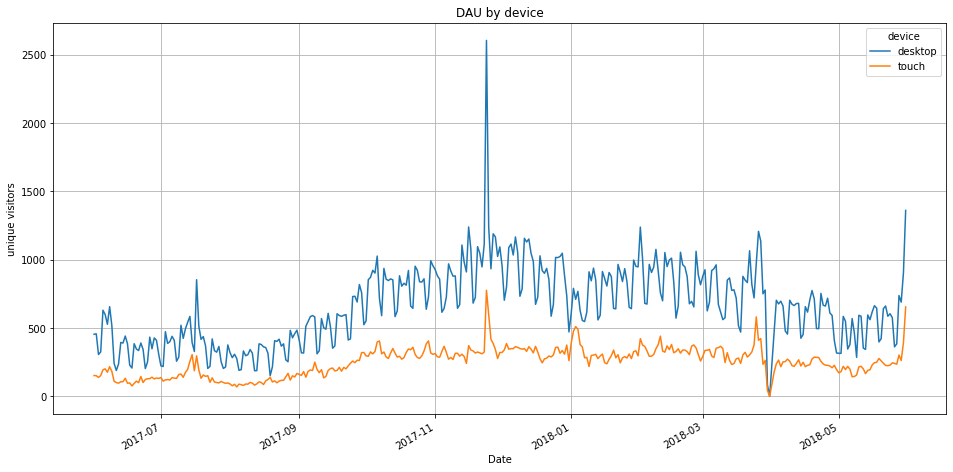

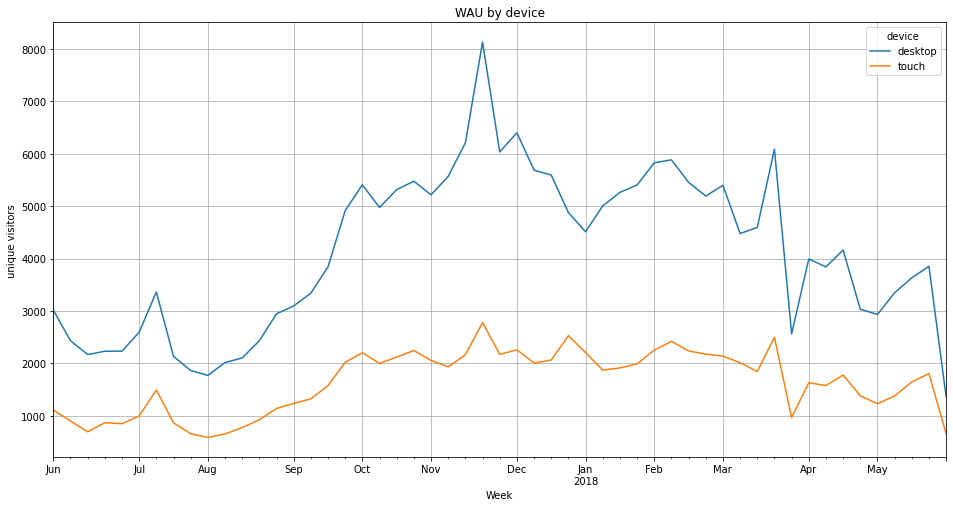

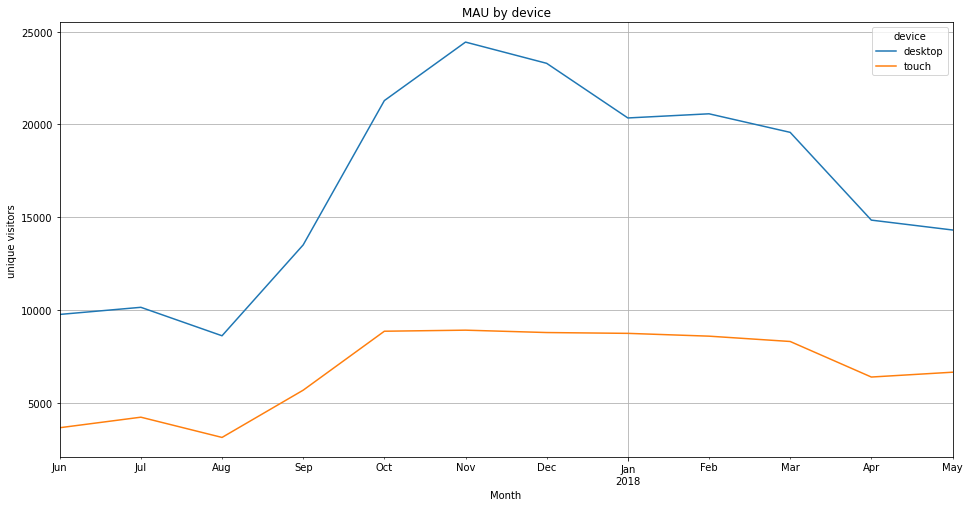

In [24]:
# plot daily active users per devices
visits.pivot_table(index = 'session_date', columns = 'device', values = 'uid', aggfunc = 'nunique').plot(grid = True, figsize = (16,8))
plt.title('DAU by device')
plt.ylabel('unique visitors')
plt.xlabel('Date')
plt.show();

# plot weekly active users per devices
visits.pivot_table(index = ['session_week'], columns = 'device', values = 'uid', aggfunc = 'nunique').plot(grid = True, figsize = (16,8))
plt.title('WAU by device')
plt.ylabel('unique visitors')
plt.xlabel('Week')
plt.show();

# plot monthly active users per devices
visits.pivot_table(index = ['session_month'], columns = 'device', values = 'uid', aggfunc = 'nunique').plot(grid = True, figsize = (16, 8))
plt.title('MAU by device')
plt.ylabel('unique visitors')
plt.xlabel('Month')
plt.show();

**We can see seasonality in which the summer time has the lowest (August) traffic and higher traffic starting a climb in September, peeking in November - December (At close to 25K unique visitors with desktops + 8.5K with touch devices). As the weather becomes warmer in April traffic declines significantly.**

**If we look at the differences in DAU, WAU and MAU indicators by device, we see that the trends between desktop and touch devices are quite similar (peaks and lows are approximately the same), but at the same time, desktop visitors are approximately 3 times more than touch devices.**

In [25]:
# Calculate DAU: number of daily active unique users
sess_day = visits.groupby('session_date').agg({'uid':'count'}).reset_index()
sess_day.columns = ['session_date', 'n_users']
sess_day_avg = sess_day['n_users'].mean()
print('Number of daily sessions:',round(sess_day_avg,2))

Number of daily sessions: 987.36


In [26]:
sessions_per_user = visits.groupby('session_date').agg({'uid': ['count','nunique']})
sessions_per_user.columns = ['n_sessions', 'n_users']
sessions_per_user['sessions_per_user'] = sessions_per_user['n_sessions'] / sessions_per_user['n_users']
sessions_per_user

,n_sessions,n_users,sessions_per_user
session_date,,,
2017-06-01,664,605,1.097521
2017-06-02,658,608,1.082237
2017-06-03,477,445,1.071910
2017-06-04,510,476,1.071429
2017-06-05,893,820,1.089024
...,...,...,...
2018-05-27,672,620,1.083871
2018-05-28,1156,1039,1.112608
2018-05-29,1035,948,1.091772


In [27]:
sessions_per_user_per_device = visits.groupby(['session_date', 'device']).agg({'uid': ['count','nunique']})
sessions_per_user_per_device.columns = ['n_sessions', 'n_users']
sessions_per_user_per_device['sessions_per_user'] = sessions_per_user_per_device['n_sessions'] / sessions_per_user_per_device['n_users']
sessions_per_user_per_device

n_sessions  n_users  sessions_per_user
session_date device                                         
2017-06-01   desktop         501      455           1.101099
             touch           163      153           1.065359
2017-06-02   desktop         498      458           1.087336
             touch           160      152           1.052632
2017-06-03   desktop         329      307           1.071661
...                          ...      ...                ...
2018-05-29   touch           284      263           1.079848
2018-05-30   desktop         989      904           1.094027
             touch           421      393           1.071247
2018-05-31   desktop        1544     1361           1.134460
             touch           712      655           1.087023

[728 rows x 3 columns]

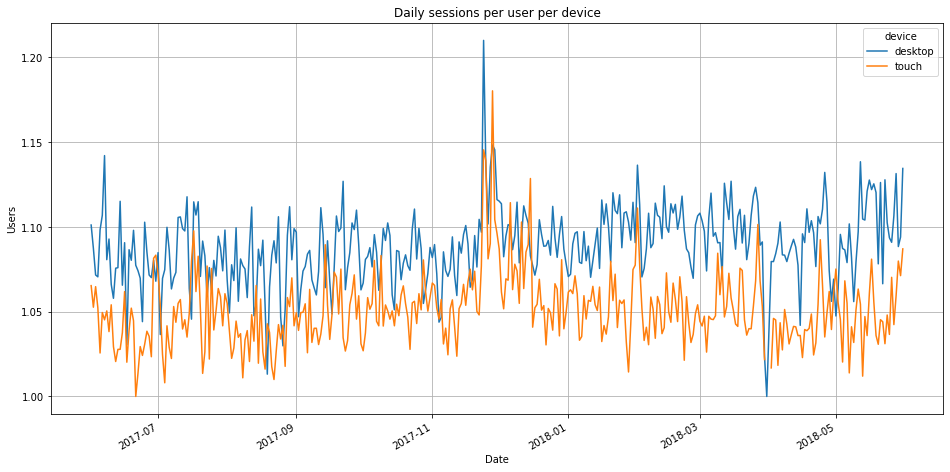

In [28]:
sessions_per_user_per_device.pivot_table(index = 'session_date', columns = 'device', values = 'sessions_per_user', aggfunc = 'mean').plot(grid = True, figsize = (16, 8))
plt.title('Daily sessions per user per device')
plt.ylabel('Users')
plt.xlabel('Date')
plt.show();

In [29]:
sessions_per_user_per_device['sessions_per_user'].mean()

1.0700366703149868

**Daily sessions per device show mostly a higher user per session ratio on desktop than touch devices and this means that there is more chances that a visitor using a desktop will be more likely returning for another visit to the website service.**

#### What is the length of each session?

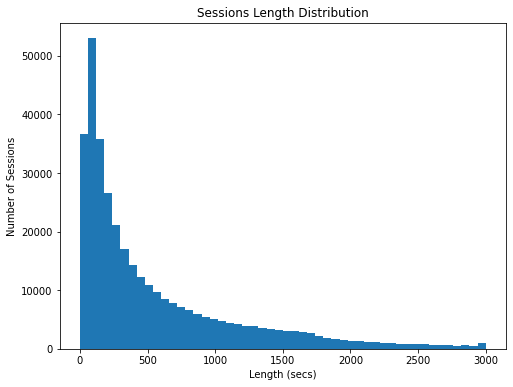

In [30]:
visits['session_duration_sec'] = (visits['end_ts'] - visits['start_ts']).dt.total_seconds()
#print(users_data['session_duration_sec'].mean())
plt.figure(figsize=(8,6))
plt.hist(visits['session_duration_sec'],range=[0,3000],bins=50)
plt.title('Sessions Length Distribution')
plt.xlabel('Length (secs)')
plt.ylabel('Number of Sessions');

In [31]:
asl_mean = visits['session_duration_sec'].mean()
asl_median = visits['session_duration_sec'].median()
asl_mode = visits['session_duration_sec'].mode()
asl_mean
asl_median
asl_mode

643.0422873805642

300.0

0    60.0
dtype: float64

**The average session is 643.5 seconds which is over 10 min. but since the distribution is not normal we need to claculate the median which is 300 seconds (5 min.) and the mode is also very useful in this case and shows us that the most common value for the sessions length is actually very low and stands at 60 seconds... Only one min.**

In [32]:
# the reviewer's code:
visits_length = (visits['end_ts'] - visits['start_ts']).dt.total_seconds()
visits_length.describe()

count    359398.000000
mean        643.042287
std         997.105212
min           0.000000
25%         120.000000
50%         300.000000
75%         840.000000
max       42660.000000
dtype: float64

**We found two rows** with a negative length of session. This can't be and these rows should be removed

In [33]:
sticky_wau = dau_avg / wau_avg * 100
sticky_mau = dau_avg / mau_avg * 100

round(sticky_wau,2)
round(sticky_mau,2)

15.86

3.91

**15.59% come back** after a week and only 3.91% after a month

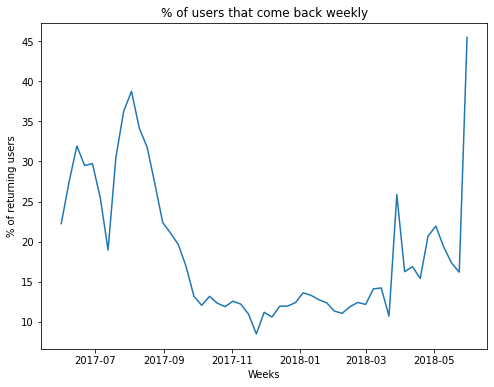

In [34]:
# graph sticky factor
wau['sticky_weekly'] = (dau_avg / wau['n_users']) * 100
plt.figure(figsize=(8,6))
plt.plot(wau['session_week'],wau['sticky_weekly'])
plt.title('% of users that come back weekly')
plt.xlabel('Weeks')
plt.ylabel('% of returning users');

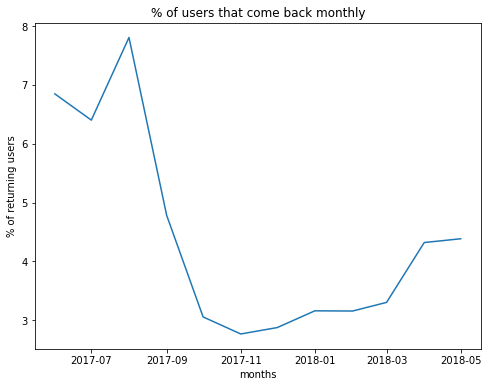

In [35]:
# graph sticky factor
mau['sticky_monthly'] = (dau_avg / mau['n_users']) * 100
plt.figure(figsize=(8,6))
plt.plot(mau['session_month'],mau['sticky_monthly'])
plt.title('% of users that come back monthly')
plt.xlabel('months')
plt.ylabel('% of returning users');

**We can see that the high season** in the winter months between October and March have the lowest percentage of returning users as it is filled with first time users

#### How often do users come back

**visit logs cohort analysis** to measure retention
- In order to measure the retention and churn rates for users we need to do a cohort analysis for the visitors activity.

In [36]:
#visits cohort analysis
first_activity_date = visits.groupby(['uid'])['start_ts'].min()
first_activity_date.name = 'first_activity_date'
visits = visits.merge(first_activity_date, how='inner', on=['uid'])
visits.head()

,device,end_ts,source_id,start_ts,uid,session_year,session_month,session_week,session_date,session_duration_sec,first_activity_date
0,touch,2017-12-20 17:38:00,4,2017-12-20 17:20:00,16879256277535980062,2017-01-01,2017-12-01,2017-12-14,2017-12-20,1080.0,2017-12-20 17:20:00
1,desktop,2018-02-19 17:21:00,2,2018-02-19 16:53:00,104060357244891740,2018-01-01,2018-02-01,2018-02-15,2018-02-19,1680.0,2018-02-19 16:53:00
2,touch,2017-07-01 01:54:00,5,2017-07-01 01:54:00,7459035603376831527,2017-01-01,2017-07-01,2017-06-29,2017-07-01,0.0,2017-07-01 01:54:00
3,desktop,2018-05-20 11:23:00,9,2018-05-20 10:59:00,16174680259334210214,2018-01-01,2018-05-01,2018-05-17,2018-05-20,1440.0,2018-03-09 20:05:00
4,desktop,2018-03-09 20:33:00,4,2018-03-09 20:05:00,16174680259334210214,2018-01-01,2018-03-01,2018-03-08,2018-03-09,1680.0,2018-03-09 20:05:00


In [37]:
visits['activity_month'] = visits['start_ts'].astype('datetime64[M]')
visits['first_activity_month'] = visits['first_activity_date'].astype('datetime64[M]')
visits.head()

,device,end_ts,source_id,start_ts,uid,session_year,session_month,session_week,session_date,session_duration_sec,first_activity_date,activity_month,first_activity_month
0,touch,2017-12-20 17:38:00,4,2017-12-20 17:20:00,16879256277535980062,2017-01-01,2017-12-01,2017-12-14,2017-12-20,1080.0,2017-12-20 17:20:00,2017-12-01,2017-12-01
1,desktop,2018-02-19 17:21:00,2,2018-02-19 16:53:00,104060357244891740,2018-01-01,2018-02-01,2018-02-15,2018-02-19,1680.0,2018-02-19 16:53:00,2018-02-01,2018-02-01
2,touch,2017-07-01 01:54:00,5,2017-07-01 01:54:00,7459035603376831527,2017-01-01,2017-07-01,2017-06-29,2017-07-01,0.0,2017-07-01 01:54:00,2017-07-01,2017-07-01
3,desktop,2018-05-20 11:23:00,9,2018-05-20 10:59:00,16174680259334210214,2018-01-01,2018-05-01,2018-05-17,2018-05-20,1440.0,2018-03-09 20:05:00,2018-05-01,2018-03-01
4,desktop,2018-03-09 20:33:00,4,2018-03-09 20:05:00,16174680259334210214,2018-01-01,2018-03-01,2018-03-08,2018-03-09,1680.0,2018-03-09 20:05:00,2018-03-01,2018-03-01


In [38]:
visits['cohort_lifetime'] = visits['activity_month'] - visits['first_activity_month']
visits['cohort_lifetime'] = (visits['cohort_lifetime'] / np.timedelta64(1,'M')).round().astype('int')
visits.head()

,device,end_ts,source_id,start_ts,uid,session_year,session_month,session_week,session_date,session_duration_sec,first_activity_date,activity_month,first_activity_month,cohort_lifetime
0,touch,2017-12-20 17:38:00,4,2017-12-20 17:20:00,16879256277535980062,2017-01-01,2017-12-01,2017-12-14,2017-12-20,1080.0,2017-12-20 17:20:00,2017-12-01,2017-12-01,0
1,desktop,2018-02-19 17:21:00,2,2018-02-19 16:53:00,104060357244891740,2018-01-01,2018-02-01,2018-02-15,2018-02-19,1680.0,2018-02-19 16:53:00,2018-02-01,2018-02-01,0
2,touch,2017-07-01 01:54:00,5,2017-07-01 01:54:00,7459035603376831527,2017-01-01,2017-07-01,2017-06-29,2017-07-01,0.0,2017-07-01 01:54:00,2017-07-01,2017-07-01,0
3,desktop,2018-05-20 11:23:00,9,2018-05-20 10:59:00,16174680259334210214,2018-01-01,2018-05-01,2018-05-17,2018-05-20,1440.0,2018-03-09 20:05:00,2018-05-01,2018-03-01,2
4,desktop,2018-03-09 20:33:00,4,2018-03-09 20:05:00,16174680259334210214,2018-01-01,2018-03-01,2018-03-08,2018-03-09,1680.0,2018-03-09 20:05:00,2018-03-01,2018-03-01,0


In [39]:
#see how many users were active from certain cohorts on a certain time after registration
cohorts = visits.pivot_table(index='first_activity_month',
                  columns='cohort_lifetime',
                  values='uid',
                  aggfunc='nunique').fillna(0)
cohorts

cohort_lifetime,0,1,2,3,4,5,6,7,8,9,10,11
first_activity_month,,,,,,,,,,,,
2017-06-01,13259.0,1043.0,713.0,814.0,909.0,947.0,809.0,766.0,694.0,674.0,539.0,596.0
2017-07-01,13140.0,737.0,674.0,738.0,765.0,633.0,596.0,601.0,510.0,376.0,361.0,0.0
2017-08-01,10181.0,783.0,640.0,639.0,510.0,448.0,370.0,402.0,284.0,265.0,0.0,0.0
2017-09-01,16704.0,1428.0,1156.0,847.0,658.0,632.0,599.0,404.0,381.0,0.0,0.0,0.0
2017-10-01,25977.0,2042.0,1357.0,1012.0,890.0,837.0,555.0,529.0,0.0,0.0,0.0,0.0
2017-11-01,27248.0,2133.0,1202.0,1054.0,919.0,638.0,594.0,0.0,0.0,0.0,0.0,0.0
2017-12-01,25268.0,1410.0,960.0,786.0,512.0,481.0,0.0,0.0,0.0,0.0,0.0,0.0
2018-01-01,22624.0,1351.0,890.0,565.0,458.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2018-02-01,22197.0,1267.0,565.0,446.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [40]:
retention=cohorts.iloc[:,0:].div(cohorts[0], axis=0)
retention

cohort_lifetime,0,1,2,3,4,5,6,7,8,9,10,11
first_activity_month,,,,,,,,,,,,
2017-06-01,1.0,0.078664,0.053775,0.061392,0.068557,0.071423,0.061015,0.057772,0.052342,0.050833,0.040652,0.044951
2017-07-01,1.0,0.056088,0.051294,0.056164,0.058219,0.048174,0.045358,0.045738,0.038813,0.028615,0.027473,0.000000
2017-08-01,1.0,0.076908,0.062862,0.062764,0.050093,0.044004,0.036342,0.039485,0.027895,0.026029,0.000000,0.000000
2017-09-01,1.0,0.085489,0.069205,0.050706,0.039392,0.037835,0.035860,0.024186,0.022809,0.000000,0.000000,0.000000
2017-10-01,1.0,0.078608,0.052239,0.038958,0.034261,0.032221,0.021365,0.020364,0.000000,0.000000,0.000000,0.000000
2017-11-01,1.0,0.078281,0.044113,0.038682,0.033727,0.023415,0.021800,0.000000,0.000000,0.000000,0.000000,0.000000
2017-12-01,1.0,0.055802,0.037993,0.031107,0.020263,0.019036,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2018-01-01,1.0,0.059715,0.039339,0.024973,0.020244,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2018-02-01,1.0,0.057080,0.025454,0.020093,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


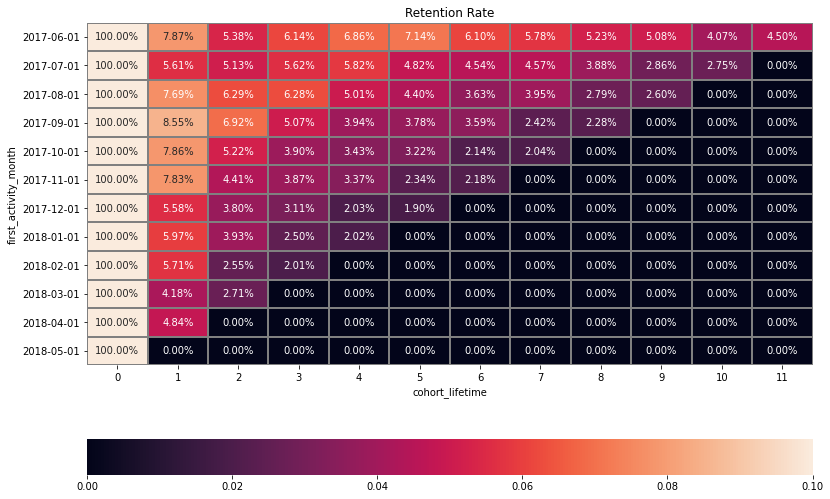

In [41]:
# the first line just formats cohort into a str for a nicer output
plt.figure(figsize=(13, 9))
retention.index=retention.index.astype(str)
sns.heatmap(retention, annot=True, fmt='.2%', linewidths=1, linecolor='grey', vmax=0.1, 
            cbar_kws= {'orientation': 'horizontal'}).set(title = 'Retention Rate')
plt.show();

In [42]:
v_cohorts = visits.groupby(['first_activity_month','cohort_lifetime', 'device'])\
.agg({'uid':'nunique'}).reset_index()
v_cohorts

,first_activity_month,cohort_lifetime,device,uid
0,2017-06-01,0,desktop,9761
1,2017-06-01,0,touch,3655
2,2017-06-01,1,desktop,833
3,2017-06-01,1,touch,241
4,2017-06-01,2,desktop,593
...,...,...,...,...
283,2018-05-01,9,touch,0
284,2018-05-01,10,desktop,0
285,2018-05-01,10,touch,0
286,2018-05-01,11,desktop,0


In [43]:
users_count = v_cohorts[v_cohorts['cohort_lifetime'] == 0][['first_activity_month','uid','device']]
users_count.head()

,first_activity_month,uid,device
0,2017-06-01,9761,desktop
1,2017-06-01,3655,touch
24,2017-07-01,9312,desktop
25,2017-07-01,3982,touch
48,2017-08-01,7450,desktop


In [44]:
users_count = users_count.rename(columns={'uid':'cohort_users'})
users_count.head()

,first_activity_month,cohort_users,device
0,2017-06-01,9761,desktop
1,2017-06-01,3655,touch
24,2017-07-01,9312,desktop
25,2017-07-01,3982,touch
48,2017-08-01,7450,desktop


In [45]:
v_cohorts = v_cohorts.merge(users_count,on=['first_activity_month', 'device'])
v_cohorts.head()

,first_activity_month,cohort_lifetime,device,uid,cohort_users
0,2017-06-01,0,desktop,9761,9761
1,2017-06-01,1,desktop,833,9761
2,2017-06-01,2,desktop,593,9761
3,2017-06-01,3,desktop,671,9761
4,2017-06-01,4,desktop,741,9761


In [46]:
v_cohorts['retention'] = v_cohorts['uid'] / v_cohorts['cohort_users']

In [47]:
v_cohorts_desktop = v_cohorts[v_cohorts['device'] == 'desktop']
v_cohorts_touch = v_cohorts[v_cohorts['device'] == 'touch']

In [48]:
retention_pivot_desktop = v_cohorts_desktop.pivot_table(
    index='first_activity_month',columns='cohort_lifetime',values='retention',aggfunc='sum')
retention_pivot_desktop

cohort_lifetime,0,1,2,3,4,5,6,7,8,9,10,11
first_activity_month,,,,,,,,,,,,
2017-06-01,1.0,0.085340,0.060752,0.068743,0.075914,0.081856,0.067206,0.064235,0.058805,0.056552,0.045180,0.048253
2017-07-01,1.0,0.060997,0.055842,0.060997,0.064648,0.051869,0.050043,0.049721,0.041989,0.031035,0.028458,0.000000
2017-08-01,1.0,0.080940,0.066040,0.067651,0.054497,0.046846,0.037450,0.040537,0.031409,0.029262,0.000000,0.000000
2017-09-01,1.0,0.088263,0.074691,0.055911,0.041400,0.042254,0.038412,0.025779,0.023816,0.000000,0.000000,0.000000
2017-10-01,1.0,0.082922,0.055011,0.040106,0.036909,0.035012,0.022926,0.022384,0.000000,0.000000,0.000000,0.000000
2017-11-01,1.0,0.080431,0.044811,0.040042,0.033832,0.024293,0.022405,0.000000,0.000000,0.000000,0.000000,0.000000
2017-12-01,1.0,0.052654,0.038353,0.030607,0.020098,0.020098,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2018-01-01,1.0,0.062117,0.040357,0.026124,0.021317,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2018-02-01,1.0,0.060118,0.026819,0.020018,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


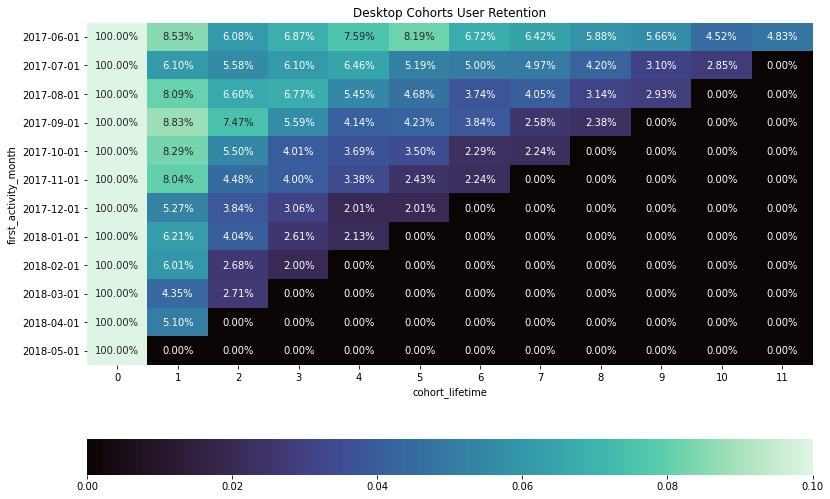

In [49]:
#plot desktop user retention heatmap
plt.figure(figsize=(13, 9))
retention_pivot_desktop.index=retention_pivot_desktop.index.astype(str)
plt.title('Desktop Cohorts User Retention')
sns.heatmap(retention_pivot_desktop, annot=True, fmt='.2%', vmin = 0.0,vmax = 0.1,
            cbar_kws= {'orientation': 'horizontal'}, cmap = 'mako');
plt.show();

**8.8% of the users return after the first month.**
The user retention mostly decreases from month to month, except for slight increases.
June 2017 cohort initially began with the highest user retention rates. There was a campaign boosting retention in cohort lifetime periods 4-5 which increased retention and this cohort also keeps retention rates quite high in comparison to others even 11 months later at 4.8%.

In [50]:
retention_pivot_touch = v_cohorts_touch.pivot_table(
    index='first_activity_month',columns='cohort_lifetime',values='retention',aggfunc='sum')
retention_pivot_touch

cohort_lifetime,0,1,2,3,4,5,6,7,8,9,10,11
first_activity_month,,,,,,,,,,,,
2017-06-01,1.0,0.065937,0.039672,0.047332,0.058550,0.055267,0.054993,0.045964,0.042681,0.042955,0.034473,0.042681
2017-07-01,1.0,0.047966,0.043697,0.048970,0.047966,0.044450,0.037670,0.037921,0.034907,0.024611,0.027373,0.000000
2017-08-01,1.0,0.071173,0.057582,0.055436,0.040773,0.040057,0.035408,0.039700,0.019671,0.019671,0.000000,0.000000
2017-09-01,1.0,0.084941,0.061562,0.044224,0.037210,0.031560,0.032340,0.020456,0.021625,0.000000,0.000000,0.000000
2017-10-01,1.0,0.073376,0.049045,0.037325,0.030701,0.027643,0.018344,0.016051,0.000000,0.000000,0.000000,0.000000
2017-11-01,1.0,0.077747,0.044962,0.036398,0.035461,0.021410,0.020206,0.000000,0.000000,0.000000,0.000000,0.000000
2017-12-01,1.0,0.066620,0.038451,0.033380,0.020141,0.016901,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2018-01-01,1.0,0.058421,0.038757,0.022514,0.018524,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2018-02-01,1.0,0.052447,0.022561,0.020803,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


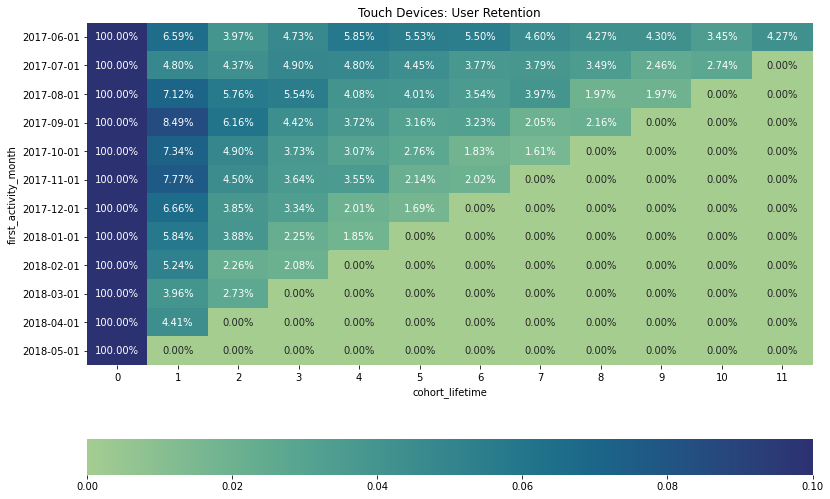

In [51]:
#plot heatmap for touch user retention
plt.figure(figsize=(13, 9))
retention_pivot_touch.index=retention_pivot_touch.index.astype(str)
plt.title('Touch Devices: User Retention')
sns.heatmap(retention_pivot_touch, annot=True, fmt='.2%', vmin = 0.0,vmax = 0.1,
            cbar_kws= {'orientation': 'horizontal'}, cmap = 'crest');
plt.show();

**A month after the first visit, no more than 8.53% of users with desktop devices return.**
The user retention rate mostly decreases from month to month, but increases slightly,
the June 2017 cohort starts with the highest user retention rate at 8.5% and maintains a 4.3% retention rate after 11 months which is quite high compared to the rest of the cohorts.

In [52]:
#cohorts churn rate for desktop users
v_cohorts_desktop['churn_rate'] = v_cohorts_desktop.groupby(['first_activity_month'])['uid'].pct_change()

In [53]:
churn_pivot_d = v_cohorts_desktop.pivot_table(
    index='first_activity_month',
    columns='cohort_lifetime',
    values='churn_rate',
    aggfunc='sum',
)

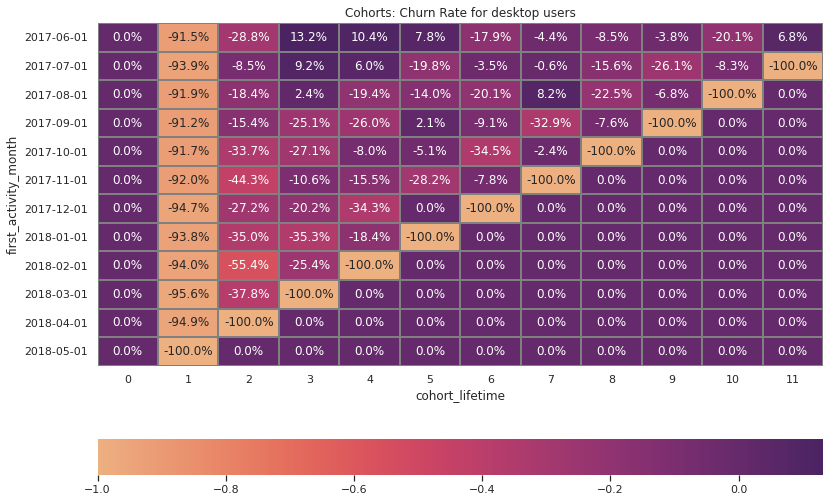

In [54]:
sns.set(style='white')
churn_pivot_d.index=churn_pivot_d.index.astype(str)
plt.figure(figsize=(13, 9))
plt.title('Cohorts: Churn Rate for desktop users')
sns.heatmap(churn_pivot_d, annot=True, fmt='.1%', linewidths=1, linecolor='gray',
            cbar_kws= {'orientation': 'horizontal'}, cmap='flare');

**similar to the retention,** the best churn rate results are in the first cohort and during Aug-Oct this cohort even had a positive churn rate. Let's see the touch devices churn to see if there is a difference in behaviour that will implicate any problems with the product based on the customer churn.

In [55]:
#cohorts churn rate for touch users
v_cohorts_touch['churn_rate'] = v_cohorts_touch.groupby(['first_activity_month'])['uid'].pct_change()

In [56]:
churn_pivot_t = v_cohorts_touch.pivot_table(
    index='first_activity_month',
    columns='cohort_lifetime',
    values='churn_rate',
    aggfunc='sum',
)

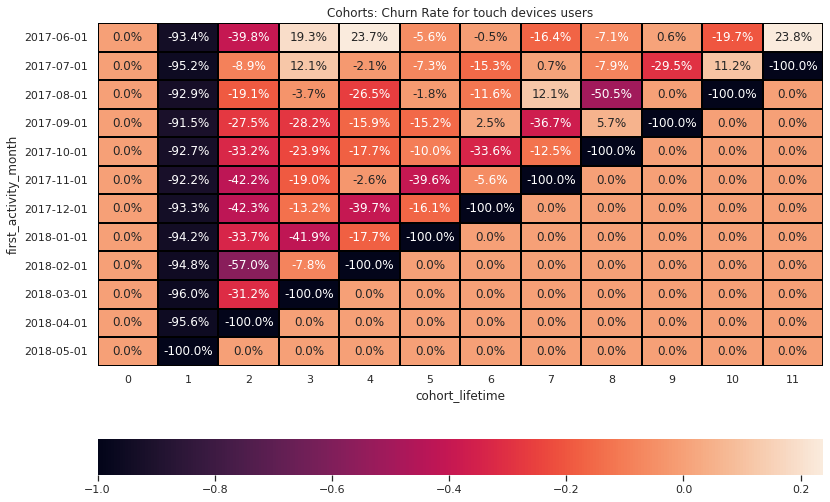

In [57]:
sns.set(style='white')
churn_pivot_t.index=churn_pivot_d.index.astype(str)
plt.figure(figsize=(13, 9))
plt.title('Cohorts: Churn Rate for touch devices users')
sns.heatmap(churn_pivot_t, annot=True, fmt='.1%', linewidths=1, linecolor='black',
            cbar_kws= {'orientation': 'horizontal'});

**Churn for the touch** devices looks with thee same patterns as the desktop in terms of the different cohorts behaviours. The overall numbers are not suggesting something outstanding.

**Product summary**
- The number of daily active unique users is 908 and they make an average of 987 sessions per day with a median session duration of about 22 minutes.
- 5716 people users per week and 23228 per month.
- The first cohort - Jun-2017 has the highest retention rate over the entire period year.
- The best churn rate results are in the first cohort and during Aug-Oct this cohort even had a positive churn rate
- A month after the first visit, no more than 8.53% of users with desktop devices return. 
- The user retention rate mostly decreases from month to month, but increases slightly, the June 2017 cohort starts with the highest user retention rate at 8.5% and maintains the most consistent performance with a 4.3% retention rate after 11 months which is quite high compared to the rest of the cohorts.

### Sales

#### When do people start buying? When do we have conversion?

In [58]:
#get first order date for each user
first_order_date_by_users = orders.groupby('uid')['buy_ts'].min()
first_order_date_by_users.head()

uid
313578113262317    2018-01-03 21:51:00
1575281904278712   2017-06-03 10:13:00
2429014661409475   2017-10-11 18:33:00
2464366381792757   2018-01-28 15:54:00
2551852515556206   2017-11-24 10:14:00
Name: buy_ts, dtype: datetime64[ns]

In [59]:
# change the Series object's name attribute in first_order_date_by_users to first_order_date
first_order_date_by_users.name = 'first_order_date'
first_order_date_by_users.head()

uid
313578113262317    2018-01-03 21:51:00
1575281904278712   2017-06-03 10:13:00
2429014661409475   2017-10-11 18:33:00
2464366381792757   2018-01-28 15:54:00
2551852515556206   2017-11-24 10:14:00
Name: first_order_date, dtype: datetime64[ns]

In [60]:
#join orders with first_order_date_by_users
orders = orders.merge(first_order_date_by_users,on='uid')
orders.head()

,buy_ts,revenue,uid,first_order_date
0,2017-06-01 00:10:00,17.00,10329302124590727494,2017-06-01 00:10:00
1,2017-06-01 00:25:00,0.55,11627257723692907447,2017-06-01 00:25:00
2,2017-06-01 00:27:00,0.37,17903680561304213844,2017-06-01 00:27:00
3,2017-06-01 00:29:00,0.55,16109239769442553005,2017-06-01 00:29:00
4,2017-06-01 07:58:00,0.37,14200605875248379450,2017-06-01 07:58:00


In [61]:
dict_=dict(zip(visits['uid'],visits['source_id']))

In [62]:
visits_group = visits.pivot_table(index=['uid','first_activity_date'],values='session_duration_sec',aggfunc='sum').reset_index()

In [63]:
orders['day_end'] = orders['buy_ts'].astype('datetime64[D]')

In [64]:
data = pd.merge(left=orders, right=visits_group,on=['uid'])
data['source_id'] = data['uid'].map(dict_)
data.head()

,buy_ts,revenue,uid,first_order_date,day_end,first_activity_date,session_duration_sec,source_id
0,2017-06-01 00:10:00,17.00,10329302124590727494,2017-06-01 00:10:00,2017-06-01,2017-06-01 00:09:00,120.0,1
1,2017-06-01 00:25:00,0.55,11627257723692907447,2017-06-01 00:25:00,2017-06-01,2017-06-01 00:14:00,660.0,2
2,2017-06-01 00:27:00,0.37,17903680561304213844,2017-06-01 00:27:00,2017-06-01,2017-06-01 00:25:00,540.0,2
3,2017-06-01 00:29:00,0.55,16109239769442553005,2017-06-01 00:29:00,2017-06-01,2017-06-01 00:14:00,1140.0,2
4,2017-06-01 07:58:00,0.37,14200605875248379450,2017-06-01 07:58:00,2017-06-01,2017-06-01 07:31:00,1680.0,3


**Adding the 'time_to_order' column to the table with time from the first visit to the first purchase.**

In [65]:
data['time_to_order']=((pd.to_datetime(data['first_order_date'])-pd.to_datetime(data['first_activity_date']))
                       /np.timedelta64(1,'D')).astype('int')
data.head()

,buy_ts,revenue,uid,first_order_date,day_end,first_activity_date,session_duration_sec,source_id,time_to_order
0,2017-06-01 00:10:00,17.00,10329302124590727494,2017-06-01 00:10:00,2017-06-01,2017-06-01 00:09:00,120.0,1,0
1,2017-06-01 00:25:00,0.55,11627257723692907447,2017-06-01 00:25:00,2017-06-01,2017-06-01 00:14:00,660.0,2,0
2,2017-06-01 00:27:00,0.37,17903680561304213844,2017-06-01 00:27:00,2017-06-01,2017-06-01 00:25:00,540.0,2,0
3,2017-06-01 00:29:00,0.55,16109239769442553005,2017-06-01 00:29:00,2017-06-01,2017-06-01 00:14:00,1140.0,2,0
4,2017-06-01 07:58:00,0.37,14200605875248379450,2017-06-01 07:58:00,2017-06-01,2017-06-01 07:31:00,1680.0,3,0


**Changing the time to order into hours**

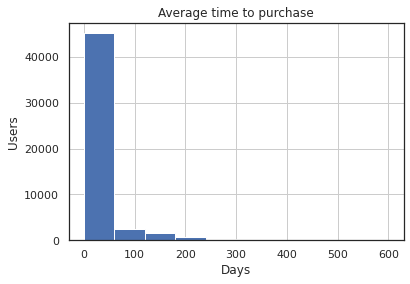

In [66]:
time_to_order = data['time_to_order'].hist(range = (0,600))

time_to_order.set_xlabel('Days')
time_to_order.set_ylabel('Users')
time_to_order.set_title('Average time to purchase')

time_to_order;

In [67]:
print('Number of unique visitors:', visits['uid'].nunique())
print('Number of unique users placing orders:', orders['uid'].nunique())
print('Average of days to conversion:',round(data['time_to_order'].mean()))
print('Median of the days to conversion:',round(data['time_to_order'].median()))
print('The overall conversion is {:.1%}'.format(orders['uid'].nunique()/visits['uid'].nunique()))
data['time_to_order'].value_counts().head(1)

Number of unique visitors: 228169
Number of unique users placing orders: 36522
Average of days to conversion: 17
Median of the days to conversion: 0
The overall conversion is 16.0%


0    34236
Name: time_to_order, dtype: int64

**The conversion rate is 16%** with an average time from first visit to first order of 17 days but the distribution is not normal so we should use the median in this case to get a reference on how skewed it is.. The median is 0 days (Actually 0.3667 hours or 22 minutes).
Almost all orders were done within the first day since visiting for the first time.

#### How many orders are made in a day/week/month?
- I will start with selecting a period of time in the data and create separate columns in the orders table.

In [68]:
data['order_year'] = data['buy_ts'].astype('datetime64[Y]')
data['order_week'] = data['buy_ts'].astype('datetime64[W]')
data['order_month'] = data['buy_ts'].astype('datetime64[M]')
data['order_date'] = data['buy_ts'].astype('datetime64[D]')
data.head()

,buy_ts,revenue,uid,first_order_date,day_end,first_activity_date,session_duration_sec,source_id,time_to_order,order_year,order_week,order_month,order_date
0,2017-06-01 00:10:00,17.00,10329302124590727494,2017-06-01 00:10:00,2017-06-01,2017-06-01 00:09:00,120.0,1,0,2017-01-01,2017-06-01,2017-06-01,2017-06-01
1,2017-06-01 00:25:00,0.55,11627257723692907447,2017-06-01 00:25:00,2017-06-01,2017-06-01 00:14:00,660.0,2,0,2017-01-01,2017-06-01,2017-06-01,2017-06-01
2,2017-06-01 00:27:00,0.37,17903680561304213844,2017-06-01 00:27:00,2017-06-01,2017-06-01 00:25:00,540.0,2,0,2017-01-01,2017-06-01,2017-06-01,2017-06-01
3,2017-06-01 00:29:00,0.55,16109239769442553005,2017-06-01 00:29:00,2017-06-01,2017-06-01 00:14:00,1140.0,2,0,2017-01-01,2017-06-01,2017-06-01,2017-06-01
4,2017-06-01 07:58:00,0.37,14200605875248379450,2017-06-01 07:58:00,2017-06-01,2017-06-01 07:31:00,1680.0,3,0,2017-01-01,2017-06-01,2017-06-01,2017-06-01


In [69]:
orders_per_day = data.groupby(by = ['order_date'])['uid'].count()
orders_per_week = data.groupby(by = ['order_week'])['uid'].count()
orders_per_month = data.groupby(by = ['order_month'])['uid'].count()
orders_per_year = data.groupby(by = ['order_year'])['uid'].count()

In [70]:
orders_per_day
orders_per_user = data.groupby('order_date').agg({'uid': ['count','nunique']})
orders_per_user.columns = ['n_orders', 'n_users']
orders_per_user['orders_per_user'] = orders_per_user['n_orders'] / orders_per_user['n_users']
orders_per_user

order_date
2017-06-01     96
2017-06-02    111
2017-06-03     67
2017-06-04     66
2017-06-05    161
             ... 
2018-05-27    107
2018-05-28    188
2018-05-29    189
2018-05-30    208
2018-05-31    610
Name: uid, Length: 363, dtype: int64

,n_orders,n_users,orders_per_user
order_date,,,
2017-06-01,96,86,1.116279
2017-06-02,111,101,1.099010
2017-06-03,67,61,1.098361
2017-06-04,66,59,1.118644
2017-06-05,161,146,1.102740
...,...,...,...
2018-05-27,107,100,1.070000
2018-05-28,188,178,1.056180
2018-05-29,189,174,1.086207


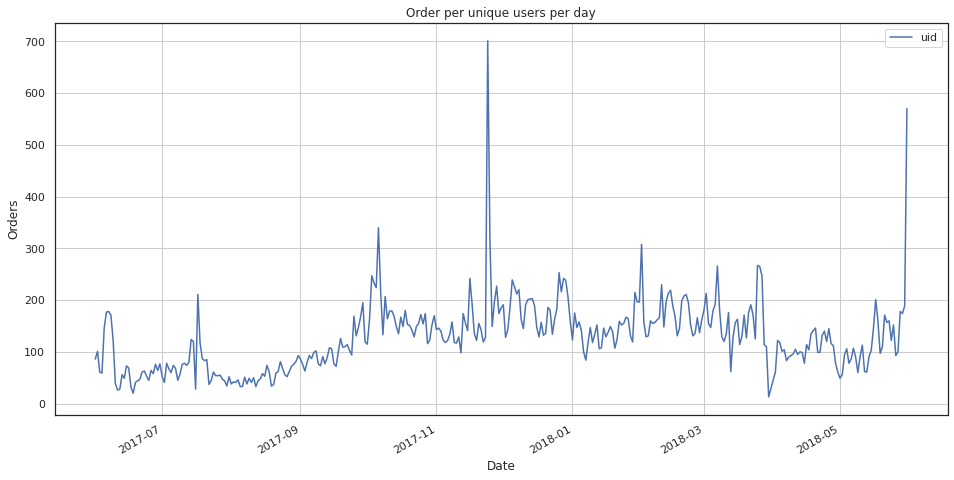

In [71]:
# plot daily active users
data.pivot_table(index = 'order_date', values = 'uid', aggfunc = 'nunique').plot(grid = True, figsize = (16,8))
plt.title('Order per unique users per day')
plt.ylabel('Orders')
plt.xlabel('Date')
plt.show();

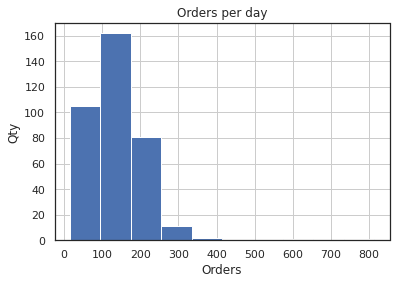

In [72]:
orders_per_day_hist = orders_per_day.hist()

orders_per_day_hist.set_xlabel("Orders")
orders_per_day_hist.set_ylabel("Qty")
orders_per_day_hist.set_title("Orders per day")

orders_per_day_hist;

In [73]:
#average orders per day
orders_per_day.mean()

138.88154269972452

In [74]:
orders_per_week

order_week
2017-06-01     896
2017-06-08     525
2017-06-15     341
2017-06-22     441
2017-06-29     461
2017-07-06     517
2017-07-13     826
2017-07-20     460
2017-07-27     338
2017-08-03     319
2017-08-10     347
2017-08-17     449
2017-08-24     501
2017-08-31     631
2017-09-07     656
2017-09-14     749
2017-09-21     936
2017-09-28    1321
2017-10-05    1575
2017-10-12    1214
2017-10-19    1119
2017-10-26    1119
2017-11-02     998
2017-11-09     993
2017-11-16    1184
2017-11-23    2120
2017-11-30    1430
2017-12-07    1479
2017-12-14    1182
2017-12-21    1437
2017-12-28    1394
2018-01-04     918
2018-01-11     972
2018-01-18    1064
2018-01-25    1276
2018-02-01    1307
2018-02-08    1429
2018-02-15    1370
2018-02-22    1175
2018-03-01    1432
2018-03-08     991
2018-03-15    1167
2018-03-22    1603
2018-03-29     469
2018-04-05     705
2018-04-12     766
2018-04-19     933
2018-04-26     642
2018-05-03     651
2018-05-10     734
2018-05-17    1156
2018-05-24    1086
2

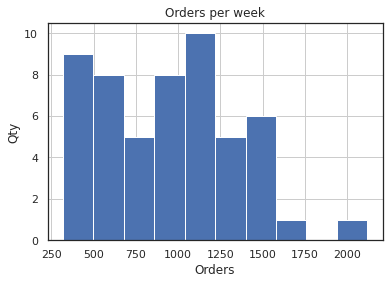

In [75]:
orders_per_week_hist = orders_per_week.hist()

orders_per_week_hist.set_xlabel("Orders")
orders_per_week_hist.set_ylabel("Qty")
orders_per_week_hist.set_title("Orders per week")

orders_per_week_hist;

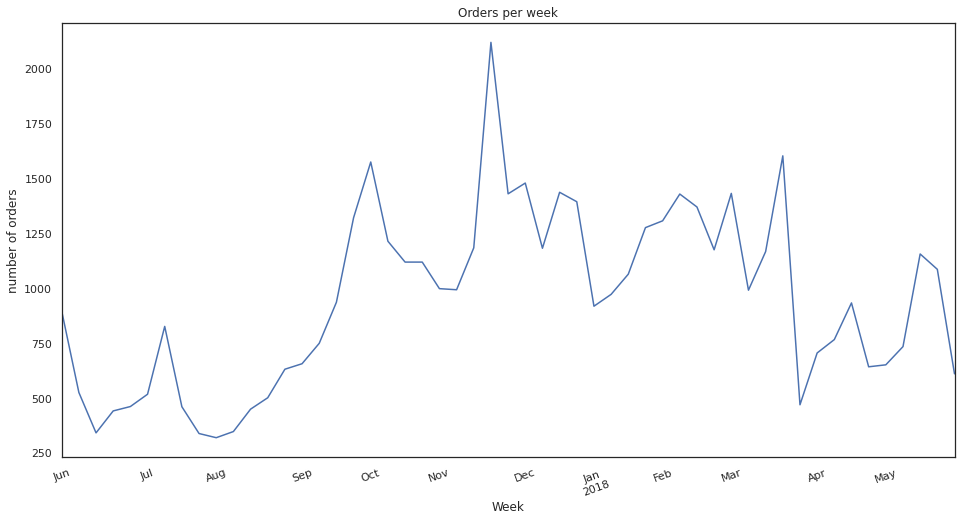

In [76]:
plt.figure(figsize=(16,8))
orders_per_week.plot()
plt.xticks(rotation = 20)
plt.ylabel('number of orders')
plt.xlabel('Week')
plt.title('Orders per week');

In [77]:
orders_per_day.describe()

count    363.000000
mean     138.881543
std       76.623567
min       15.000000
25%       83.000000
50%      136.000000
75%      177.000000
max      814.000000
Name: uid, dtype: float64

In [78]:
orders_per_week.describe()

count      53.000000
mean      951.207547
std       405.246049
min       319.000000
25%       631.000000
50%       972.000000
75%      1214.000000
max      2120.000000
Name: uid, dtype: float64

In [79]:
orders_per_month.describe()

count      12.000000
mean     4201.166667
std      1511.972092
min      1807.000000
25%      3045.500000
50%      4533.500000
75%      5409.250000
max      6218.000000
Name: uid, dtype: float64

In [80]:
orders_per_month

order_month
2017-06-01    2354
2017-07-01    2363
2017-08-01    1807
2017-09-01    3387
2017-10-01    5679
2017-11-01    5659
2017-12-01    6218
2018-01-01    4721
2018-02-01    5281
2018-03-01    5326
2018-04-01    3273
2018-05-01    4346
Name: uid, dtype: int64

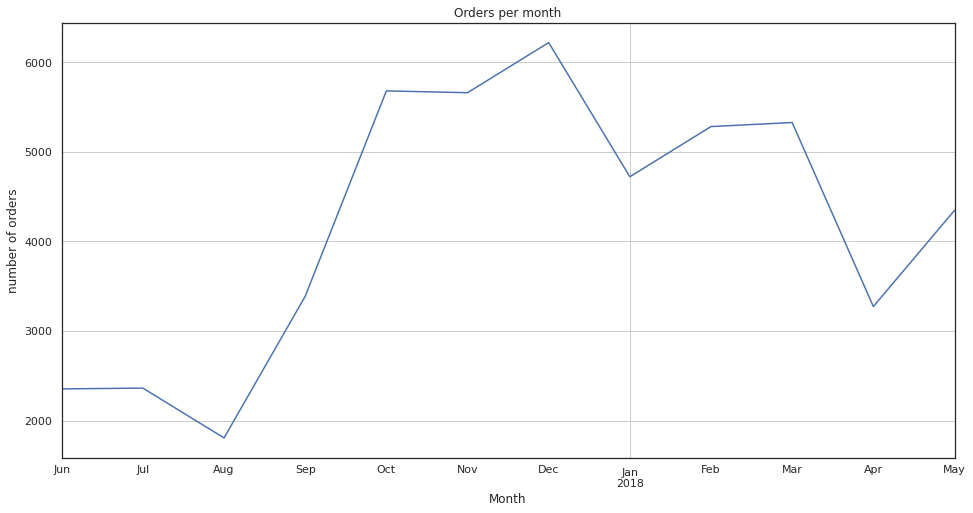

In [81]:
plt.figure(figsize=(16,8))
orders_per_month.plot(grid=True)
plt.ylabel('number of orders')
plt.xlabel('Month')
plt.title('Orders per month');

In [82]:
orders_per_year

order_year
2017-01-01    27467
2018-01-01    22947
Name: uid, dtype: int64

In [83]:
# extract order month for each order
orders['order_month'] = orders['buy_ts'].astype('datetime64[M]').dt.month

# group by order month and find # of unique users placing orders each month and find # of orders made each month
unique_orders = orders.groupby('order_month').agg({'uid':'nunique','buy_ts':'count'}).reset_index()
unique_orders.columns = ['order_month','n_unique_users','n_orders']

# create col with average monthly orders per month
unique_orders['average_monthly_orders'] = unique_orders['n_orders'] / unique_orders['n_unique_users']

# calculate average monthly purchases
avg_monthly_purchases = unique_orders['average_monthly_orders'].mean().round(decimals=2)

print('The average number of orders made in a month is ' + str(avg_monthly_purchases))

The average number of orders made in a month is 1.22


**There were 27,467 orders in 2017 (Jun-Dec) and 22,947 in 2018 (Jan - May).**
The average number of orders per month for all cohorts is 3,878, and it ranges from 2,354 (June 2017) to 6,218 (December 2017).
the average number of orders for all cohorts is 951 (and the most common value is 890), while the smallest number of orders per week was in July 2017 - at the 31st week (314 orders), and the largest at the end of November 2017 - at 47th week (1894 orders).
**The average number orders made by a user per month is 1.22**

In [84]:
#add first order month and order month columns with datetime64[M] datatype
data['first_order_month'] = data['first_order_date'].astype('datetime64[M]')
data['order_month'] = data['buy_ts'].astype('datetime64[M]')
data.head()

,buy_ts,revenue,uid,first_order_date,day_end,first_activity_date,session_duration_sec,source_id,time_to_order,order_year,order_week,order_month,order_date,first_order_month
0,2017-06-01 00:10:00,17.00,10329302124590727494,2017-06-01 00:10:00,2017-06-01,2017-06-01 00:09:00,120.0,1,0,2017-01-01,2017-06-01,2017-06-01,2017-06-01,2017-06-01
1,2017-06-01 00:25:00,0.55,11627257723692907447,2017-06-01 00:25:00,2017-06-01,2017-06-01 00:14:00,660.0,2,0,2017-01-01,2017-06-01,2017-06-01,2017-06-01,2017-06-01
2,2017-06-01 00:27:00,0.37,17903680561304213844,2017-06-01 00:27:00,2017-06-01,2017-06-01 00:25:00,540.0,2,0,2017-01-01,2017-06-01,2017-06-01,2017-06-01,2017-06-01
3,2017-06-01 00:29:00,0.55,16109239769442553005,2017-06-01 00:29:00,2017-06-01,2017-06-01 00:14:00,1140.0,2,0,2017-01-01,2017-06-01,2017-06-01,2017-06-01,2017-06-01
4,2017-06-01 07:58:00,0.37,14200605875248379450,2017-06-01 07:58:00,2017-06-01,2017-06-01 07:31:00,1680.0,3,0,2017-01-01,2017-06-01,2017-06-01,2017-06-01,2017-06-01


In [85]:
month_cohort_grouped = data.groupby('first_order_month').agg({'uid': 'nunique', 'revenue': 'sum'})
month_cohort_grouped

,uid,revenue
first_order_month,,
2017-06-01,2023,24031.69
2017-07-01,1923,16127.92
2017-08-01,1370,11606.26
2017-09-01,2581,34676.32
2017-10-01,4340,27603.45
2017-11-01,4081,26098.99
2017-12-01,4383,33485.74
2018-01-01,3373,16663.13
2018-02-01,3651,16750.50


#### What is the average order size?
**How much do users spend on average per order?**

In [86]:
avg_cost_per_order = orders['revenue'].mean()
med_cost_per_order = orders['revenue'].median()
mod_cost_per_order = orders['revenue'].mode()
avg_cost_per_order
med_cost_per_order
mod_cost_per_order

4.999678263974293

2.5

0    1.83
dtype: float64

**The overall average order revenue is 5 and the median is 2.5 and the most common order is for 1.83 but this will be in more detail based on the cohort evaluation in the next steps**

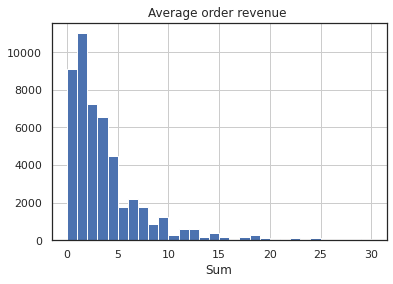

In [87]:
avg_ord_hist = orders['revenue'].hist(range = (0,30), bins = 30)
avg_ord_hist.set_xlabel("Sum")
avg_ord_hist.set_title("Average order revenue ")
avg_ord_hist;

#### average order changes by monthly cohorts

In [88]:
#add first order month and order month columns with datetime64[M] datatype
data['first_order_week'] = data['first_order_date'].astype('datetime64[W]')
data['order_week'] = data['buy_ts'].astype('datetime64[W]')
data.head()

,buy_ts,revenue,uid,first_order_date,day_end,first_activity_date,session_duration_sec,source_id,time_to_order,order_year,order_week,order_month,order_date,first_order_month,first_order_week
0,2017-06-01 00:10:00,17.00,10329302124590727494,2017-06-01 00:10:00,2017-06-01,2017-06-01 00:09:00,120.0,1,0,2017-01-01,2017-06-01,2017-06-01,2017-06-01,2017-06-01,2017-06-01
1,2017-06-01 00:25:00,0.55,11627257723692907447,2017-06-01 00:25:00,2017-06-01,2017-06-01 00:14:00,660.0,2,0,2017-01-01,2017-06-01,2017-06-01,2017-06-01,2017-06-01,2017-06-01
2,2017-06-01 00:27:00,0.37,17903680561304213844,2017-06-01 00:27:00,2017-06-01,2017-06-01 00:25:00,540.0,2,0,2017-01-01,2017-06-01,2017-06-01,2017-06-01,2017-06-01,2017-06-01
3,2017-06-01 00:29:00,0.55,16109239769442553005,2017-06-01 00:29:00,2017-06-01,2017-06-01 00:14:00,1140.0,2,0,2017-01-01,2017-06-01,2017-06-01,2017-06-01,2017-06-01,2017-06-01
4,2017-06-01 07:58:00,0.37,14200605875248379450,2017-06-01 07:58:00,2017-06-01,2017-06-01 07:31:00,1680.0,3,0,2017-01-01,2017-06-01,2017-06-01,2017-06-01,2017-06-01,2017-06-01


In [89]:
#group by weekly cohort.. 52 weeks could be too many..
week_cohort_grouped = data.groupby('first_order_week').agg({'uid': 'nunique', 'revenue': 'sum'})
week_cohort_grouped.head()

,uid,revenue
first_order_week,,
2017-06-01,774,13185.39
2017-06-08,446,3143.82
2017-06-15,298,2664.04
2017-06-22,377,3355.05
2017-06-29,397,4386.48


In [90]:
#group by monthly cohort
month_cohort_grouped = data.groupby(['first_order_month','order_month']).agg({'uid':'nunique','revenue':'sum'})
month_cohort_grouped

uid   revenue
first_order_month order_month                
2017-06-01        2017-06-01   2023   9557.49
                  2017-07-01     61    981.82
                  2017-08-01     50    885.34
                  2017-09-01     54   1931.30
                  2017-10-01     88   2068.58
...                             ...       ...
2018-03-01        2018-04-01     90   1063.05
                  2018-05-01     58   1114.87
2018-04-01        2018-04-01   2276  10600.69
                  2018-05-01     69   1209.92
2018-05-01        2018-05-01   2988  13925.76

[78 rows x 2 columns]

In [91]:
#calculate rev per user
month_cohort_grouped['revenue_per_user'] = month_cohort_grouped['revenue'] / month_cohort_grouped['uid']
month_cohort_grouped

uid   revenue  revenue_per_user
first_order_month order_month                                  
2017-06-01        2017-06-01   2023   9557.49          4.724414
                  2017-07-01     61    981.82         16.095410
                  2017-08-01     50    885.34         17.706800
                  2017-09-01     54   1931.30         35.764815
                  2017-10-01     88   2068.58         23.506591
...                             ...       ...               ...
2018-03-01        2018-04-01     90   1063.05         11.811667
                  2018-05-01     58   1114.87         19.221897
2018-04-01        2018-04-01   2276  10600.69          4.657597
                  2018-05-01     69   1209.92         17.535072
2018-05-01        2018-05-01   2988  13925.76          4.660562

[78 rows x 3 columns]

In [92]:
month_cohort_grouped = month_cohort_grouped.reset_index()

In [93]:
month_cohort_grouped['order_lifetime'] = (month_cohort_grouped['order_month'] - month_cohort_grouped['first_order_month'])
month_cohort_grouped['order_lifetime'] = month_cohort_grouped['order_lifetime'] / np.timedelta64(1,'M')
month_cohort_grouped['order_lifetime'] = month_cohort_grouped['order_lifetime'].round().astype('int')
month_cohort_grouped

,first_order_month,order_month,uid,revenue,revenue_per_user,order_lifetime
0,2017-06-01,2017-06-01,2023,9557.49,4.724414,0
1,2017-06-01,2017-07-01,61,981.82,16.095410,1
2,2017-06-01,2017-08-01,50,885.34,17.706800,2
3,2017-06-01,2017-09-01,54,1931.30,35.764815,3
4,2017-06-01,2017-10-01,88,2068.58,23.506591,4
...,...,...,...,...,...,...
73,2018-03-01,2018-04-01,90,1063.05,11.811667,1
74,2018-03-01,2018-05-01,58,1114.87,19.221897,2
75,2018-04-01,2018-04-01,2276,10600.69,4.657597,0
76,2018-04-01,2018-05-01,69,1209.92,17.535072,1


In [94]:
cohort_grouped_pivot = month_cohort_grouped.pivot_table(index='first_order_month',columns='order_lifetime',values='revenue_per_user',aggfunc='mean')
cohort_grouped_pivot.round(2).fillna('')

order_lifetime,0,1,2,3,4,5,6,7,8,9,10,11
first_order_month,,,,,,,,,,,,
2017-06-01,4.72,16.1,17.71,35.76,23.51,22.21,31.01,25.03,19.3,27.23,25.68,9.8
2017-07-01,6.01,12.4,21.04,10.79,6.94,7.9,6.42,6.99,7.38,12.86,11.51,
2017-08-01,5.28,11.15,11.85,12.18,16.92,12.14,9.62,12.61,21.07,8.31,,
2017-09-01,5.64,22.19,13.45,138.67,19.88,26.1,27.44,16.96,11.04,,,
2017-10-01,5.00,11.29,6.75,7.41,7.07,7.26,6.57,7.48,,,,
2017-11-01,5.15,7.34,6.79,12.51,7.46,4.58,7.56,,,,,
2017-12-01,4.74,7.82,39.37,48.14,27.43,23.52,,,,,,
2018-01-01,4.14,8.72,12.37,11.2,4.7,,,,,,,
2018-02-01,4.16,8.61,4.94,6.94,,,,,,,,


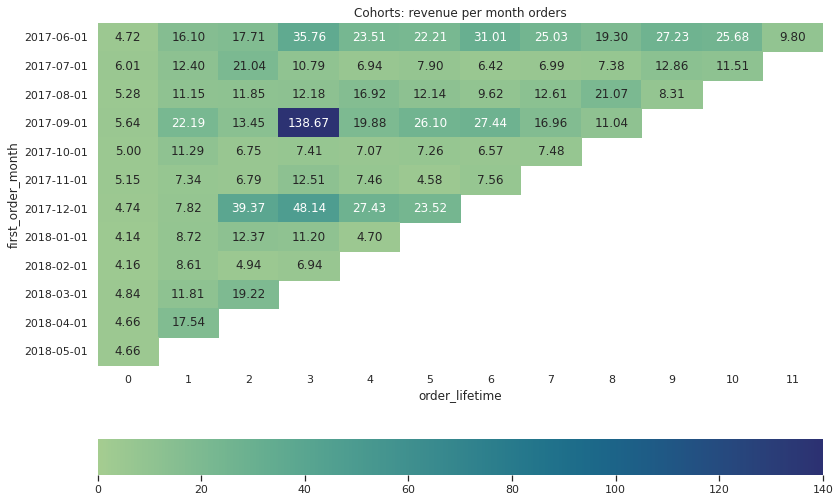

In [95]:
sns.set(style='white')
plt.figure(figsize=(13, 9))
cohort_grouped_pivot.index=cohort_grouped_pivot.index.astype(str)

plt.title('Cohorts: revenue per month orders')
sns.heatmap(cohort_grouped_pivot, annot=True,  fmt='.2f', vmin = 0,vmax = 140, 
            cbar_kws= {'orientation': 'horizontal'}, cmap = 'crest');
plt.show();

In [96]:
month_cohort_grouped.loc[(month_cohort_grouped['first_order_month'] == '2017-09-01')
                         & (month_cohort_grouped['order_month'] == '2017-12-01')]

,first_order_month,order_month,uid,revenue,revenue_per_user,order_lifetime
36,2017-09-01,2017-12-01,74,10261.52,138.669189,3


In [97]:
data.loc[(data['first_order_month'] == '2017-09-01') & (data['order_month'] == '2017-12-01')].agg({'uid': ['count','nunique']})

,uid
count,164
nunique,74


**The December 2017 order month for cohort september 2017 stands out so it makes sense to take a closer look at it.**

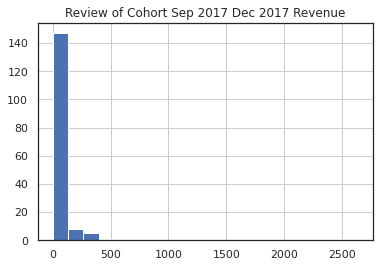

In [98]:
sep_coh_orders = data.loc[(data['first_order_month'] == '2017-09-01') & (data['order_month'] == '2017-12-01')]['revenue']
sep_coh_orders_hist = sep_coh_orders.hist(bins=20)

sep_coh_orders_hist.set_title('Review of Cohort Sep 2017 Dec 2017 Revenue');

In [99]:
sep_coh_orders.max()

2633.28

In [100]:
sep_coh_orders.sort_values(ascending= False).head(10)

11732    2633.28
11730    1195.64
11745     604.39
11724     402.72
11728     360.55
11723     344.36
11750     337.33
11759     304.94
11733     293.03
11731     243.83
Name: revenue, dtype: float64

In [101]:
orders.sort_values(by = 'revenue', ascending= False).head(10)

,buy_ts,revenue,uid,first_order_date,day_end,order_month
11732,2017-12-10 20:17:00,2633.28,5539673724080479777,2017-09-20 19:55:00,2017-12-10,12
28613,2018-02-23 08:54:00,1236.28,11149926373378902217,2017-12-17 18:06:00,2018-02-23,2
28614,2018-02-24 09:25:00,1221.37,11149926373378902217,2017-12-17 18:06:00,2018-02-24,2
11730,2017-12-10 13:04:00,1195.64,5539673724080479777,2017-09-20 19:55:00,2017-12-10,12
28608,2017-12-17 18:06:00,1109.10,11149926373378902217,2017-12-17 18:06:00,2017-12-17,12
28623,2018-05-16 19:53:00,1080.44,11149926373378902217,2017-12-17 18:06:00,2018-05-16,5
28616,2018-03-18 09:13:00,1073.11,11149926373378902217,2017-12-17 18:06:00,2018-03-18,3
28622,2018-04-26 20:06:00,948.44,11149926373378902217,2017-12-17 18:06:00,2018-04-26,4
28615,2018-03-15 19:22:00,856.78,11149926373378902217,2017-12-17 18:06:00,2018-03-15,3
28617,2018-03-19 18:15:00,685.67,11149926373378902217,2017-12-17 18:06:00,2018-03-19,3


- One disproportionately large order, that pushes the average upwards and skews the distribution.
- The average first month of all cohorts is 4.99 but the variance between cohorts is quite significant.
- Usually, the average grows over time (with a few exceptions).
- June and December 2017 cohorts have the highest average (36 and 48, respectively).
- On December 2017, on the September cohort, the average was very high in reference to all others (138.6). Upon closer examination, it turns out that one of the orders during this period was very large at 2633, and along with a few more large orders shifted the average upwards much higher than usual.

#### How much money do they bring? (LTV)

LTV (life time value) - the total amount of money that one client brings in all of his orders.
Next I will calculate LTV by cohorts using the orders, month_cohorts_grouped and the costs tables. For the LTV I will keep the separation by devices.

In [102]:
orders['order_month'] = orders['buy_ts'].astype('datetime64[M]')
costs['month'] = costs['dt'].astype('datetime64[M]')

In [103]:
first_orders = orders.groupby('uid').agg({'order_month': 'min'}).reset_index()
first_orders.columns = ['uid', 'first_order_month']

cohort_sizes = (
    first_orders.groupby('first_order_month')
    .agg({'uid': 'nunique'})
    .reset_index()
)
cohort_sizes.columns = ['first_order_month', 'n_users']
cohort_sizes

,first_order_month,n_users
0,2017-06-01,2023
1,2017-07-01,1923
2,2017-08-01,1370
3,2017-09-01,2581
4,2017-10-01,4340
5,2017-11-01,4081
6,2017-12-01,4383
7,2018-01-01,3373
8,2018-02-01,3651
9,2018-03-01,3533


In [104]:
#sum orders revenue by month and merge with cohort sizes
orders_sum = pd.merge(orders, first_orders, on='uid')
cohorts = (
    orders_sum.groupby(['first_order_month', 'order_month'])
    .agg({'revenue': 'sum'})
    .reset_index()
)
report = pd.merge(cohort_sizes, cohorts, on='first_order_month')
report

,first_order_month,n_users,order_month,revenue
0,2017-06-01,2023,2017-06-01,9557.49
1,2017-06-01,2023,2017-07-01,981.82
2,2017-06-01,2023,2017-08-01,885.34
3,2017-06-01,2023,2017-09-01,1931.30
4,2017-06-01,2023,2017-10-01,2068.58
...,...,...,...,...
73,2018-03-01,3533,2018-04-01,1063.05
74,2018-03-01,3533,2018-05-01,1114.87
75,2018-04-01,2276,2018-04-01,10600.69
76,2018-04-01,2276,2018-05-01,1209.92


In [105]:
report['gp'] = report['revenue']
report['age'] = (
    report['order_month'] - report['first_order_month']
) / np.timedelta64(1, 'M')
report['age'] = report['age'].round().astype('int')

report['ltv'] = report['gp'] / report['n_users']
print('Overall LTV is:', round(report['ltv'].mean(),ndigits=2))

Overall LTV is: 1.12


In [106]:
report

,first_order_month,n_users,order_month,revenue,gp,age,ltv
0,2017-06-01,2023,2017-06-01,9557.49,9557.49,0,4.724414
1,2017-06-01,2023,2017-07-01,981.82,981.82,1,0.485329
2,2017-06-01,2023,2017-08-01,885.34,885.34,2,0.437637
3,2017-06-01,2023,2017-09-01,1931.30,1931.30,3,0.954671
4,2017-06-01,2023,2017-10-01,2068.58,2068.58,4,1.022531
...,...,...,...,...,...,...,...
73,2018-03-01,3533,2018-04-01,1063.05,1063.05,1,0.300892
74,2018-03-01,3533,2018-05-01,1114.87,1114.87,2,0.315559
75,2018-04-01,2276,2018-04-01,10600.69,10600.69,0,4.657597
76,2018-04-01,2276,2018-05-01,1209.92,1209.92,1,0.531599


In [107]:
result_ltv = report.pivot_table(
    index='first_order_month', columns='age', values='ltv', aggfunc='mean'
).round(2)
result_ltv.round(2).fillna('')

age,0,1,2,3,4,5,6,7,8,9,10,11
first_order_month,,,,,,,,,,,,
2017-06-01,4.72,0.49,0.44,0.95,1.02,0.74,0.95,0.58,0.55,0.61,0.57,0.26
2017-07-01,6.01,0.34,0.62,0.36,0.18,0.16,0.12,0.14,0.16,0.15,0.16,
2017-08-01,5.28,0.47,0.46,0.39,0.49,0.28,0.21,0.41,0.29,0.19,,
2017-09-01,5.64,1.12,0.52,3.98,0.4,0.65,0.7,0.24,0.18,,,
2017-10-01,5.00,0.54,0.19,0.16,0.15,0.12,0.08,0.12,,,,
2017-11-01,5.15,0.4,0.2,0.32,0.15,0.05,0.11,,,,,
2017-12-01,4.74,0.26,0.93,1.07,0.31,0.34,,,,,,
2018-01-01,4.14,0.29,0.3,0.14,0.06,,,,,,,
2018-02-01,4.16,0.28,0.08,0.07,,,,,,,,


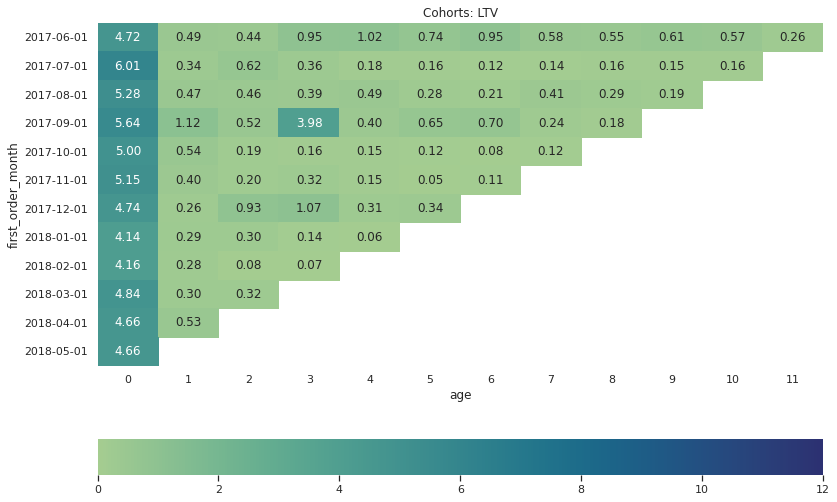

In [108]:
sns.set(style='white')
plt.figure(figsize=(13, 9))
result_ltv.index=result_ltv.index.astype(str)
plt.title('Cohorts: LTV')
sns.heatmap(result_ltv, annot=True,  fmt='.2f', vmin = 0,vmax = 12,cmap = 'crest',
            cbar_kws= {'orientation': 'horizontal'});
plt.show();

**LTV points out** the seasonality of the orders for the service and also looking again at the lead of the first cohort. In the September cohort we have a huge month in December 2017 and overall strong results as well. Let's see how it looks like in the cumulative summary

In [109]:
report['ltv'] = report['gp'] / report['n_users']
result_ltv = report.pivot_table(
        index='first_order_month', 
        columns='age', 
        values='ltv', 
        aggfunc='mean')
result_ltv_sum = result_ltv.cumsum(axis = 1)
result_ltv_sum.round(2).fillna('')

age,0,1,2,3,4,5,6,7,8,9,10,11
first_order_month,,,,,,,,,,,,
2017-06-01,4.72,5.21,5.65,6.6,7.62,8.36,9.31,9.89,10.45,11.05,11.62,11.88
2017-07-01,6.01,6.35,6.97,7.33,7.5,7.66,7.78,7.92,8.08,8.23,8.39,
2017-08-01,5.28,5.75,6.21,6.6,7.09,7.38,7.59,7.99,8.28,8.47,,
2017-09-01,5.64,6.76,7.28,11.26,11.66,12.31,13.01,13.25,13.44,,,
2017-10-01,5.00,5.54,5.73,5.89,6.04,6.16,6.24,6.36,,,,
2017-11-01,5.15,5.55,5.75,6.08,6.23,6.28,6.4,,,,,
2017-12-01,4.74,5.0,5.92,6.99,7.3,7.64,,,,,,
2018-01-01,4.14,4.43,4.73,4.88,4.94,,,,,,,
2018-02-01,4.16,4.44,4.51,4.59,,,,,,,,


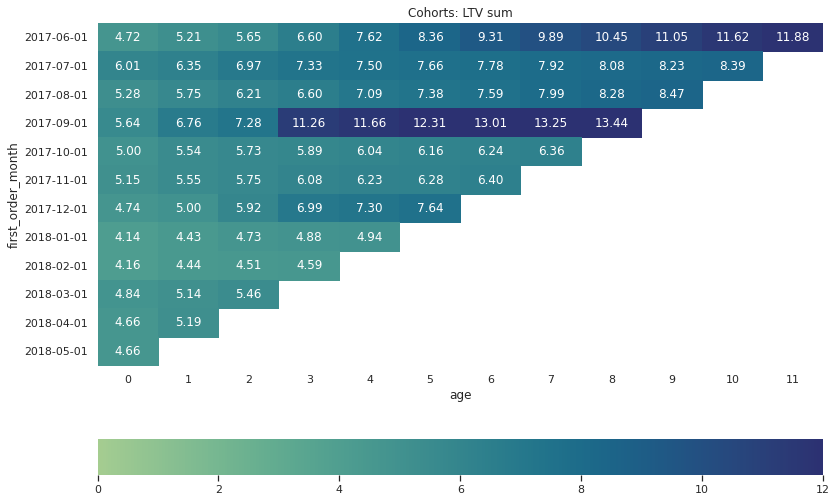

In [110]:
sns.set(style='white')
plt.figure(figsize=(13, 9))
result_ltv_sum.index=result_ltv_sum.index.astype(str)
plt.title('Cohorts: LTV sum')
sns.heatmap(result_ltv_sum, annot=True, fmt='.2f', vmin = 0, vmax = 12,
            cbar_kws= {'orientation': 'horizontal'}, cmap = 'crest');
plt.show();

In [111]:
m12_cum_ltv = result_ltv.cumsum(axis=1).mean(axis=0)[11]
# find the cumulative LTV for 12 months from the moment the first order was made
print('Average LTV for 12 months from the first order:', m12_cum_ltv)

Average LTV for 12 months from the first order: 11.879233811171527


**On average, each user in the June 2017 cohort brought in 11.88 units of revenue over the 12 months.**

We can see in the heat map that the September 2017 cohort was the most successful - by the 5th month of life, it is already ahead of the June 2017 cohort in terms of cumulative LTV, which reached such indicators only by the 10-11th month of life.
As seen previously, this is due a specific user transaction skewing the data up on the sep 2017 cohort.

**Sales summary**
- The sales conversion rate is 16%.
- Average time from first visit to first order of 17 days, The median is 0 days which as the distribution is skewed.
- Almost all orders were done within the first day while visiting for the first time.
- There were 27,467 orders in 2017 (Jun-Dec) and 22,947 in 2018 (Jan - May). The average number of orders per month for all cohorts is 3,878, and it ranges from 2,354 (June 2017) to 6,218 (December 2017).
- The average number of orders for all cohorts is 951 (and the most common value is 890), while the smallest number of orders per week was in July 2017 - at the 31st week (314 orders), and the largest at the end of November 2017 - at 47th week (1894 orders). 
- The average number of orders made by a user per month is 1.22
- The overall average order revenue is 5 and the median is 2.5 and the most common order is for 1.83 but this will be in more detail based on the cohort evaluation in the next steps.
- LTV points out the seasonality of the orders for the service and also looking again at the lead of the first cohort. In the September cohort we have a huge month in December 2017 and overall strong results as well. Let's see how it looks like in the cumulative summary
- On average, each user in the June 2017 cohort brought in 11.88 units of revenue over the 12 months

### Marketing 

#### How much money was spent Overall?
Based on the results of the previous metrics we now need to see the marketing expenses by cohort and by marketing expense source id. This will set us up for the last stage in which we will be able to see the return on investment by cohort as well as by marketing expense source and be able to recommend how to move forward based on the data. 

In [112]:
#sorting cost for futher visualization
costs=costs.sort_values(by=['dt','source_id'])
costs.head()

,source_id,dt,costs,month
0,1,2017-06-01,75.20,2017-06-01
363,2,2017-06-01,132.56,2017-06-01
726,3,2017-06-01,349.38,2017-06-01
1089,4,2017-06-01,76.74,2017-06-01
1452,5,2017-06-01,73.24,2017-06-01


In [113]:
print('Total marketing cost is {}'.format(costs['costs'].sum()))

Total marketing cost is 329131.62


In [114]:
#see how the costs are distributed by source_id
costs_per_source = costs.groupby('source_id').agg({'costs': 'sum'})
costs_per_source

,costs
source_id,
1,20833.27
2,42806.04
3,141321.63
4,61073.60
5,51757.10
9,5517.49
10,5822.49


In [4]:
#plotting costs per source_id over time
import plotly.express as px
fig = px.line(costs, x="dt", y="costs", color='source_id')

fig.show()

This looks very condensed but we definitely can see that source 3 is the highest expense throughout the entire year. We can see a seasonality in the expenses through the year with the high season beginning in October until March. December is the month with the highest expenses and August we spent the least. This marketing cost (visually) correlates with DAU/WAU/MAU from the product analysis which means we have a direct connection between the marketing expenses and the amount of visits in our logs. What about revenue? The LTV correlates with this seasonality as well.

#### How much did customer acquisition from each of the sources cost?

In [116]:
#group costs per month
costs_by_month=costs.groupby(['month'])['costs'].sum().reset_index()
costs_by_month

,month,costs
0,2017-06-01,18015.00
1,2017-07-01,18240.59
2,2017-08-01,14790.54
3,2017-09-01,24368.91
4,2017-10-01,36322.88
5,2017-11-01,37907.88
6,2017-12-01,38315.35
7,2018-01-01,33518.52
8,2018-02-01,32723.03
9,2018-03-01,30415.27


In [117]:
#count unique uid's per month to evaluate number of users(buyers) per month
buyers_per_month=data.groupby(['first_order_month'])['uid'].nunique().reset_index()
buyers_per_month.columns=['month','buyers']
buyers_per_month.head()

,month,buyers
0,2017-06-01,2023
1,2017-07-01,1923
2,2017-08-01,1370
3,2017-09-01,2581
4,2017-10-01,4340


In [118]:
#merge buyers per month with costs and calculate cac per month
CAC_per_month=costs_by_month.merge(buyers_per_month,how='left',on=['month'])
CAC_per_month['CAC']=CAC_per_month['costs']/CAC_per_month['buyers']
CAC_per_month

,month,costs,buyers,CAC
0,2017-06-01,18015.00,2023,8.905091
1,2017-07-01,18240.59,1923,9.485486
2,2017-08-01,14790.54,1370,10.796015
3,2017-09-01,24368.91,2581,9.441654
4,2017-10-01,36322.88,4340,8.369327
5,2017-11-01,37907.88,4081,9.288870
6,2017-12-01,38315.35,4383,8.741809
7,2018-01-01,33518.52,3373,9.937302
8,2018-02-01,32723.03,3651,8.962758
9,2018-03-01,30415.27,3533,8.608907


In [119]:
round(CAC_per_month['CAC'].mean(),ndigits=2)

9.15

In [120]:
#plot cac per month
fig = px.line(CAC_per_month, x="month", y="CAC", title='CAC')
fig.add_hline(y=round(CAC_per_month['CAC'].mean(),ndigits=2),line_dash="dash", line_color="purple", annotation_text="CAC average",
             annotation_position="top right")
fig.show() #if not displaying remove markdown to fig.show()

**The cost of customer acquisition** fluctuates along the year. We can see that the cost is higher during the summer time in July and august and this is due to the fact that there are much less visits and orders during that time. The cost drops in October but then event though we know that the number of users is reaching the highest numbers the CAC is climbing upwards because there are simply a lot of marketing expenses building up towards the holidays peak. This seasonality coresponds with the previous seasonal indicators we have seen in the data.

#### CAC per source

In [121]:
orders.head()

,buy_ts,revenue,uid,first_order_date,day_end,order_month
0,2017-06-01 00:10:00,17.00,10329302124590727494,2017-06-01 00:10:00,2017-06-01,2017-06-01
1,2017-06-01 00:25:00,0.55,11627257723692907447,2017-06-01 00:25:00,2017-06-01,2017-06-01
2,2017-06-01 00:27:00,0.37,17903680561304213844,2017-06-01 00:27:00,2017-06-01,2017-06-01
3,2017-06-01 00:29:00,0.55,16109239769442553005,2017-06-01 00:29:00,2017-06-01,2017-06-01
4,2017-06-01 07:58:00,0.37,14200605875248379450,2017-06-01 07:58:00,2017-06-01,2017-06-01


In [122]:
costs.head()

,source_id,dt,costs,month
0,1,2017-06-01,75.20,2017-06-01
363,2,2017-06-01,132.56,2017-06-01
726,3,2017-06-01,349.38,2017-06-01
1089,4,2017-06-01,76.74,2017-06-01
1452,5,2017-06-01,73.24,2017-06-01


In [123]:
visits.groupby(['uid'])['source_id'].nunique().reset_index().query('source_id > 1')

,uid,source_id
16,1260655184775459,2
37,2471247936243530,2
40,2892676062023446,3
52,3605148382144603,3
65,4735760515861892,2
...,...,...
228143,18445407535914413204,2
228146,18445456946869452085,3
228148,18445601152732270159,2
228154,18445884613277162497,3


In [124]:
first_source=visits.sort_values('start_ts').groupby('uid').first()['source_id'].reset_index()
first_source.columns=['uid','first_source']
first_source.head()

,uid,first_source
0,11863502262781,3
1,49537067089222,2
2,297729379853735,3
3,313578113262317,2
4,325320750514679,5


In [125]:
orders = orders.merge(first_source,on=['uid'],how='left')
orders.head()

,buy_ts,revenue,uid,first_order_date,day_end,order_month,first_source
0,2017-06-01 00:10:00,17.00,10329302124590727494,2017-06-01 00:10:00,2017-06-01,2017-06-01,1
1,2017-06-01 00:25:00,0.55,11627257723692907447,2017-06-01 00:25:00,2017-06-01,2017-06-01,2
2,2017-06-01 00:27:00,0.37,17903680561304213844,2017-06-01 00:27:00,2017-06-01,2017-06-01,2
3,2017-06-01 00:29:00,0.55,16109239769442553005,2017-06-01 00:29:00,2017-06-01,2017-06-01,2
4,2017-06-01 07:58:00,0.37,14200605875248379450,2017-06-01 07:58:00,2017-06-01,2017-06-01,3


In [126]:
monthly_costs_source = costs.groupby(['month','source_id'])['costs'].sum().reset_index()
monthly_costs_source

,month,source_id,costs
0,2017-06-01,1,1125.61
1,2017-06-01,2,2427.38
2,2017-06-01,3,7731.65
3,2017-06-01,4,3514.80
4,2017-06-01,5,2616.12
...,...,...,...
79,2018-05-01,3,9411.42
80,2018-05-01,4,4214.21
81,2018-05-01,5,3669.56
82,2018-05-01,9,362.17


In [127]:
buyers_per_month_source=orders.groupby(['order_month','first_source'])['uid'].nunique().reset_index()
buyers_per_month_source.columns=['month','source_id','buyers']
buyers_per_month_source.head()

,month,source_id,buyers
0,2017-06-01,1,190
1,2017-06-01,2,235
2,2017-06-01,3,638
3,2017-06-01,4,413
4,2017-06-01,5,384


In [128]:
#actual cac calculations
CAC_per_month_source=monthly_costs_source.merge(buyers_per_month_source,how='left',on=['month','source_id'])
CAC_per_month_source['CAC']=CAC_per_month_source['costs']/CAC_per_month_source['buyers']
CAC_per_month_source.head()

,month,source_id,costs,buyers,CAC
0,2017-06-01,1,1125.61,190,5.924263
1,2017-06-01,2,2427.38,235,10.329277
2,2017-06-01,3,7731.65,638,12.118574
3,2017-06-01,4,3514.80,413,8.510412
4,2017-06-01,5,2616.12,384,6.812813


In [129]:
CAC_piv = CAC_per_month_source.pivot_table(
    index= 'month', columns='source_id', values='CAC', aggfunc='mean').reset_index()
CAC_piv

source_id,month,1,2,3,4,5,9,10
0,2017-06-01,5.924263,10.329277,12.118574,8.510412,6.812813,4.194412,3.307579
1,2017-07-01,6.095909,10.801435,14.617848,6.736126,6.860732,5.708302,6.223019
2,2017-08-01,7.436016,13.029137,16.694402,9.088588,5.842995,3.607681,5.963333
3,2017-09-01,5.890235,11.847857,12.195288,8.415332,6.228382,4.035146,5.234886
4,2017-10-01,6.158910,10.509761,12.732395,5.207494,5.802213,3.808813,2.917395
5,2017-11-01,6.384230,10.580000,12.996443,4.256572,8.193446,3.692865,5.869333
6,2017-12-01,6.034021,10.487794,11.155103,5.010091,6.860421,4.415973,6.798526
7,2018-01-01,7.461365,11.391068,13.105115,4.959855,7.460444,4.716897,6.268878
8,2018-02-01,6.680242,11.561602,11.419390,4.544121,6.501679,4.447581,3.588657
9,2018-03-01,5.393419,9.064690,11.575973,4.819620,7.259006,2.342878,2.645276


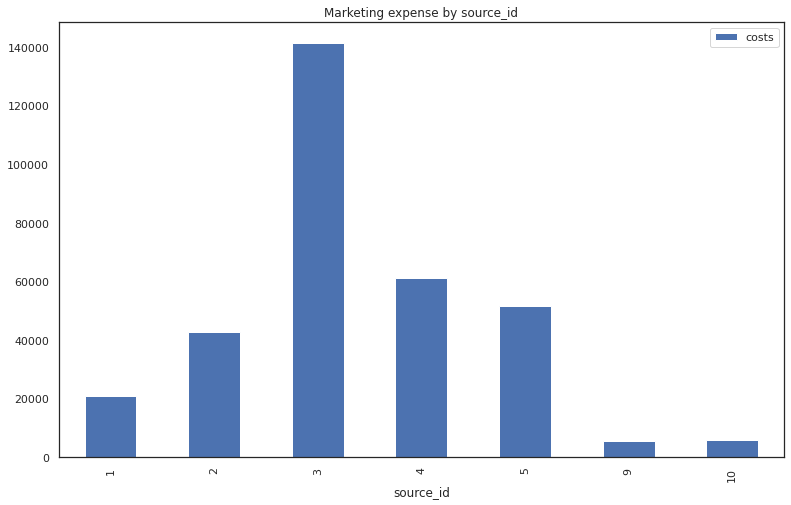

In [130]:
CAC_per_month_source.pivot_table(
    index = 'source_id',
    values='costs',
    aggfunc='sum').plot(kind ='bar', figsize=(13, 8))
plt.title('Marketing expense by source_id')
plt.xlabel('source_id')
plt.show();

In [131]:
#costs_per_source.plot(kind ='bar', figsize=(13, 8))
#plt.title('Marketing expense by source_id')
#plt.xlabel('source_id')
#plt.show();

The highest marketing budget was spent on the 3rd source_id (141321.63 units). The lowest expense was on sources 9 and 10, 5517.49 and 5822.49, respectively. The 3rd source had such a high expense, it better pay off. 

In [132]:
costs

,source_id,dt,costs,month
0,1,2017-06-01,75.20,2017-06-01
363,2,2017-06-01,132.56,2017-06-01
726,3,2017-06-01,349.38,2017-06-01
1089,4,2017-06-01,76.74,2017-06-01
1452,5,2017-06-01,73.24,2017-06-01
...,...,...,...,...
1088,3,2018-05-31,822.30,2018-05-01
1451,4,2018-05-31,492.54,2018-05-01
1815,5,2018-05-31,398.04,2018-05-01
2178,9,2018-05-31,27.37,2018-05-01


In [133]:
costs.groupby(['source_id']).agg({'costs': 'sum'})

,costs
source_id,
1,20833.27
2,42806.04
3,141321.63
4,61073.60
5,51757.10
9,5517.49
10,5822.49


In [134]:
costs_per_month = costs.groupby(['month','source_id']).agg({'costs': 'sum'})
costs_per_month.reset_index()

,month,source_id,costs
0,2017-06-01,1,1125.61
1,2017-06-01,2,2427.38
2,2017-06-01,3,7731.65
3,2017-06-01,4,3514.80
4,2017-06-01,5,2616.12
...,...,...,...
79,2018-05-01,3,9411.42
80,2018-05-01,4,4214.21
81,2018-05-01,5,3669.56
82,2018-05-01,9,362.17


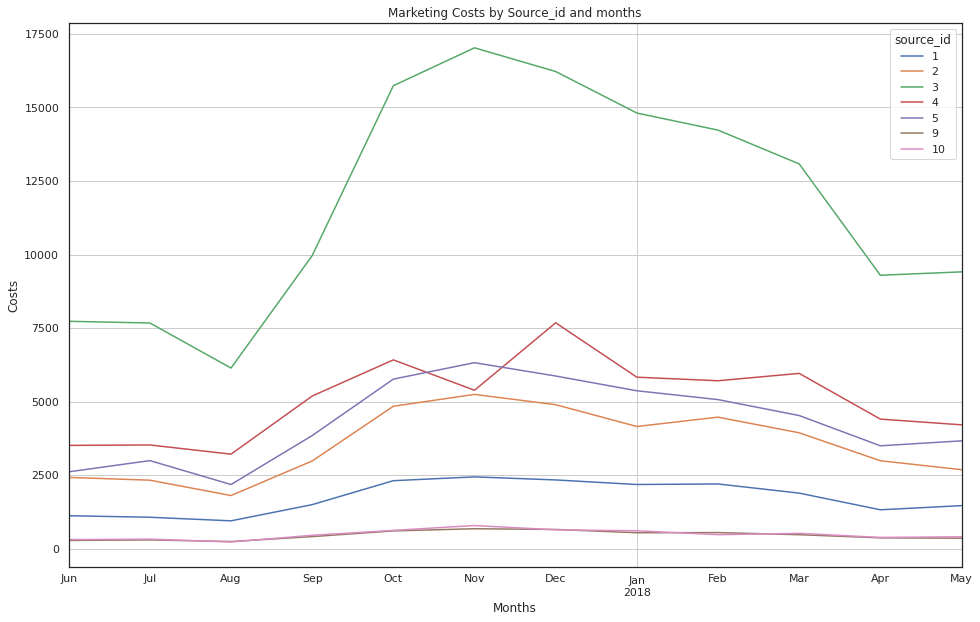

In [135]:
CAC_per_month_source.pivot_table(index = ['month'], columns = 'source_id', values = 'costs', aggfunc = 'mean').plot(grid = True, figsize = (16, 10))
plt.title('Marketing Costs by Source_id and months')
plt.ylabel('Costs')
plt.xlabel('Months')
plt.show();

Another visualization of the expense per per source id. This time by months. We can see that the expense begins to rise in the summer time when the results of traffic and revenue are the lowest and creating pressure to act upon it. Oct - Mar are the busiest months (peaking in Dec-Jan) and they are also the biggest on marketing expense. We just need to see if the expense went to the right sources..

#### How worthwhile where the investments? ROI / ROMI

In [136]:
CAC_per_month_ROI=CAC_per_month[['month','CAC']]
CAC_per_month_ROI.columns=['first_order_month','CAC']
ROI=report.merge(CAC_per_month_ROI,on=['first_order_month'],how='left')
ROI

,first_order_month,n_users,order_month,revenue,gp,age,ltv,CAC
0,2017-06-01,2023,2017-06-01,9557.49,9557.49,0,4.724414,8.905091
1,2017-06-01,2023,2017-07-01,981.82,981.82,1,0.485329,8.905091
2,2017-06-01,2023,2017-08-01,885.34,885.34,2,0.437637,8.905091
3,2017-06-01,2023,2017-09-01,1931.30,1931.30,3,0.954671,8.905091
4,2017-06-01,2023,2017-10-01,2068.58,2068.58,4,1.022531,8.905091
...,...,...,...,...,...,...,...,...
73,2018-03-01,3533,2018-04-01,1063.05,1063.05,1,0.300892,8.608907
74,2018-03-01,3533,2018-05-01,1114.87,1114.87,2,0.315559,8.608907
75,2018-04-01,2276,2018-04-01,10600.69,10600.69,0,4.657597,9.793225
76,2018-04-01,2276,2018-05-01,1209.92,1209.92,1,0.531599,9.793225


In [137]:
ROI['ROI']=ROI['ltv']/ROI['CAC']
roi_piv = ROI.pivot_table(
    index='first_order_month', columns='age', values='ROI', aggfunc='mean'
).cumsum(axis=1).round(2) 
roi_piv

age,0,1,2,3,4,5,6,7,8,9,10,11
first_order_month,,,,,,,,,,,,
2017-06-01,0.53,0.59,0.63,0.74,0.86,0.94,1.05,1.11,1.17,1.24,1.31,1.33
2017-07-01,0.63,0.67,0.73,0.77,0.79,0.81,0.82,0.84,0.85,0.87,0.88,NaN
2017-08-01,0.49,0.53,0.57,0.61,0.66,0.68,0.70,0.74,0.77,0.78,NaN,NaN
2017-09-01,0.60,0.72,0.77,1.19,1.23,1.30,1.38,1.40,1.42,NaN,NaN,NaN
2017-10-01,0.60,0.66,0.68,0.70,0.72,0.74,0.75,0.76,NaN,NaN,NaN,NaN
2017-11-01,0.55,0.60,0.62,0.65,0.67,0.68,0.69,NaN,NaN,NaN,NaN,NaN
2017-12-01,0.54,0.57,0.68,0.80,0.84,0.87,NaN,NaN,NaN,NaN,NaN,NaN
2018-01-01,0.42,0.45,0.48,0.49,0.50,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2018-02-01,0.46,0.49,0.50,0.51,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [138]:
ROI['ROI']=ROI['ltv']/ROI['CAC']
roi_piv = ROI.pivot_table(
    index='first_order_month', columns='age', values='ROI', aggfunc='mean'
)
roi_piv.cumsum(axis=1).round(2).fillna('')

age,0,1,2,3,4,5,6,7,8,9,10,11
first_order_month,,,,,,,,,,,,
2017-06-01,0.53,0.59,0.63,0.74,0.86,0.94,1.05,1.11,1.17,1.24,1.31,1.33
2017-07-01,0.63,0.67,0.73,0.77,0.79,0.81,0.82,0.84,0.85,0.87,0.88,
2017-08-01,0.49,0.53,0.57,0.61,0.66,0.68,0.7,0.74,0.77,0.78,,
2017-09-01,0.60,0.72,0.77,1.19,1.23,1.3,1.38,1.4,1.42,,,
2017-10-01,0.60,0.66,0.68,0.7,0.72,0.74,0.75,0.76,,,,
2017-11-01,0.55,0.6,0.62,0.65,0.67,0.68,0.69,,,,,
2017-12-01,0.54,0.57,0.68,0.8,0.84,0.87,,,,,,
2018-01-01,0.42,0.45,0.48,0.49,0.5,,,,,,,
2018-02-01,0.46,0.49,0.5,0.51,,,,,,,,


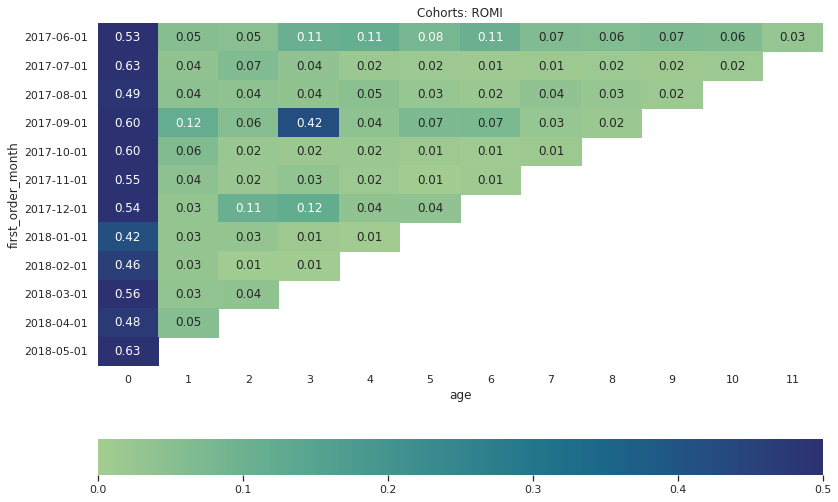

In [139]:
sns.set(style='white')
plt.figure(figsize=(13, 9))
roi_piv.index=roi_piv.index.astype(str)
plt.title('Cohorts: ROMI')
sns.heatmap(roi_piv, annot=True,  fmt='.2f', vmin = 0,vmax = 0.5,
            cbar_kws= {'orientation': 'horizontal'},cmap = 'crest')
plt.show();

**cohorts jun-2017 and sep-2017 have the highest returns on marketing investments. While jun-2017 is consitently stable in it's profitability ratios, the jun-2017 cohort is has a standout peak on the fourth month which make a big effect on this cohorts overall performance**

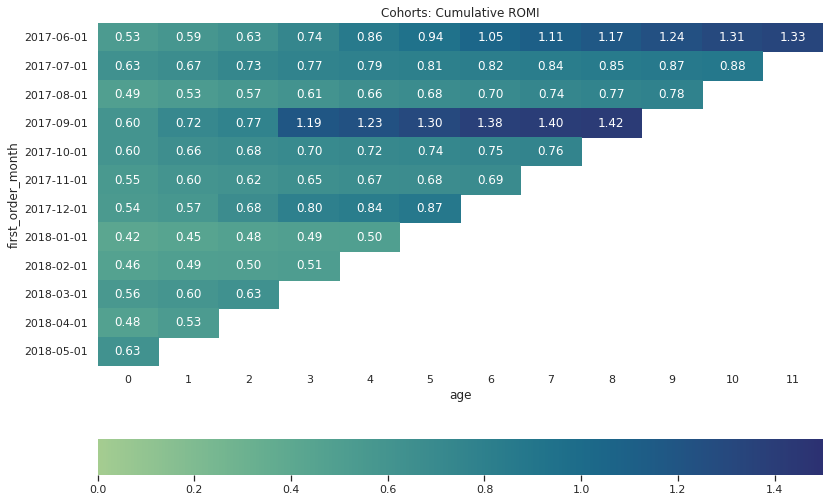

In [140]:
sns.set(style='white')
plt.figure(figsize=(13, 9))
roi_piv.index=roi_piv.index.astype(str)
plt.title('Cohorts: Cumulative ROMI')
sns.heatmap(roi_piv.cumsum(axis=1), annot=True,  fmt='.2f', vmin = 0,
            cbar_kws= {'orientation': 'horizontal'},vmax = 1.5,cmap = 'crest')
plt.show();

As we see, our return on investment is very positive right from the first month, but it's not always consistent. We see that **only cohorts 1 and 4 returned revenues over their cost of acquisition.**
The cohorts starting on new yearly quarters have better results than the rest and the cohort starting on December 2017 will most likely return investment in a couple of months.
Even though the Jul-2017 cohort started strong, it never peaked and really slowed down and even after 11 months it is not profitable.
Let's see what ROMI per source looks like..

In [141]:
CAC_per_month_source

,month,source_id,costs,buyers,CAC
0,2017-06-01,1,1125.61,190,5.924263
1,2017-06-01,2,2427.38,235,10.329277
2,2017-06-01,3,7731.65,638,12.118574
3,2017-06-01,4,3514.80,413,8.510412
4,2017-06-01,5,2616.12,384,6.812813
...,...,...,...,...,...
79,2018-05-01,3,9411.42,992,9.487319
80,2018-05-01,4,4214.21,947,4.450063
81,2018-05-01,5,3669.56,571,6.426550
82,2018-05-01,9,362.17,82,4.416707


In [143]:
ltv_per_source=data.groupby(['source_id'])['uid','revenue'].agg({'uid':'nunique','revenue':'sum'}).reset_index()
ltv_per_source.columns=['source_id','buyers','revenue']
ltv_per_source['ltv']=ltv_per_source['revenue']/ltv_per_source['buyers']
ltv_per_source

,source_id,buyers,revenue,ltv
0,1,3831,40619.71,10.602900
1,2,4239,63180.52,14.904581
2,3,9158,44575.20,4.867351
3,4,9893,50546.84,5.109354
4,5,6753,42665.96,6.318075
5,7,1,1.22,1.220000
6,9,1417,6547.26,4.620508
7,10,1230,3917.07,3.184610


In [144]:
romi_per_source=costs_per_source.merge(ltv_per_source,on=['source_id'])
romi_per_source['cac']=romi_per_source['costs']/romi_per_source['buyers']
romi_per_source['romi']=romi_per_source['ltv']/romi_per_source['cac']
romi_per_source

,source_id,costs,buyers,revenue,ltv,cac,romi
0,1,20833.27,3831,40619.71,10.602900,5.438076,1.949752
1,2,42806.04,4239,63180.52,14.904581,10.098146,1.475972
2,3,141321.63,9158,44575.20,4.867351,15.431495,0.315417
3,4,61073.60,9893,50546.84,5.109354,6.173416,0.827638
4,5,51757.10,6753,42665.96,6.318075,7.664312,0.824350
5,9,5517.49,1417,6547.26,4.620508,3.893783,1.186637
6,10,5822.49,1230,3917.07,3.184610,4.733732,0.672748


In [146]:
romi_per_source['cac']=romi_per_source['costs']/romi_per_source['buyers']
romi_per_source['romi']=romi_per_source['ltv']/romi_per_source['cac']
romi_per_source

,source_id,costs,buyers,revenue,ltv,cac,romi
0,1,20833.27,3831,40619.71,10.602900,5.438076,1.949752
1,2,42806.04,4239,63180.52,14.904581,10.098146,1.475972
2,3,141321.63,9158,44575.20,4.867351,15.431495,0.315417
3,4,61073.60,9893,50546.84,5.109354,6.173416,0.827638
4,5,51757.10,6753,42665.96,6.318075,7.664312,0.824350
5,9,5517.49,1417,6547.26,4.620508,3.893783,1.186637
6,10,5822.49,1230,3917.07,3.184610,4.733732,0.672748


In [147]:
fig = px.bar(romi_per_source, x='source_id', y='romi')
fig.update_xaxes(type='category')
fig.add_hline(y=1,line_dash="dash", line_color="purple", annotation_text="payback threshold",
             annotation_position="top right")
fig.show();

From the above visualization we can learn immediately that only source id's 1,2 and 9 have been worth the investment. The worst results are with source id 3. What source should we increase the flow from and which should we cut out? next in overall conclusion summary.

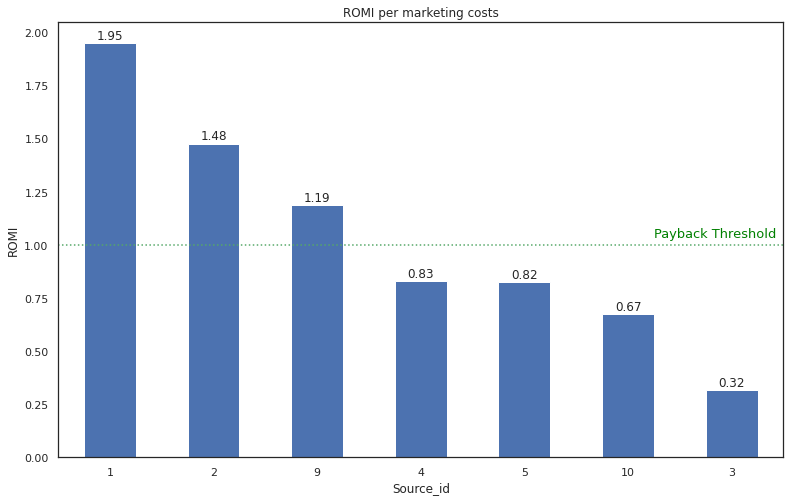

In [149]:
romi_source_plt = romi_per_source.sort_values(by='romi', ascending=False).reset_index()

ax=romi_source_plt.plot(y='romi', x='source_id', kind='bar', figsize=(13, 8),\
                    title='ROMI per marketing costs', legend=False, rot=360)
plt.axhline(y=1, color='g', linestyle=':')
ax.text(.99, 0.5, 'Payback Threshold',
        verticalalignment='bottom', horizontalalignment='right',
        transform=ax.transAxes,
        color='green', fontsize=13)
for p in ax.patches:
    height = p.get_height()
    ax.text(p.get_x()+p.get_width()/2.,
            height+0.02,
            '{:.2f}'.format(height),
            fontsize=12,
            ha="center")
plt.xlabel('Source_id')
plt.ylabel('ROMI')
plt.show();

## Conclusion

**Through most of this analysis** with a few exceptions, I have used the cohort analysis method as the vehicle to find the necessary information that would reveal the necessary information that will allow to make decisions based on the data.
**Yadnex.Afisha service** is used by 23,228 unique users per month through the 12 months of data we analyzed between Jun-2017 and May 2018.

- The number of daily active unique users is 908 and they make an average of 987 sessions per day with a median session duration of about 22 minutes.
- 5716 people users per week and 23228 per month.
- The first cohort - Jun-2017 has the highest retention rate over the entire period year.
- In most cases, an order is made on the day of the first visit to the site and in 1 minute - this indicates that most of ten people come in with a specific purpose - to buy.
- The overall average order revenue is 5, the median is 2.5 and the most common length is 1 minute.
- A buying user makes 1.38 purchases in average per month.
- The overall conversion is 16.0%
- Only the June cohort (at 6 months of life) and the September cohort (at 4 months) returned their investments.
- We can still be optimistic about the December cohort returning investment in a couple of months as well.
- In 2017, 27467 purchases were made, and in 2018 - 22948. The average number of purchases per month for all cohorts is 3878, it ranges from 2354 (in June 2017) to 6218 (in December 2017) - most likely because people use/buy with it for the holidays.
- On average, each user from the June 2017 cohort brought in a revenue of 11.8.
- Total marketing spend: 329131.62. The highest budget was spent on the 3rd source: 141321.63). The least budget was spent on sources 9 and 10 (5517.49 and 5822.49 units, respectively). 
- The highest budget was spent in December 2017 (38315.35 units) compared to other months. October and November 2017 are slightly behind it.

**Recommendations:**
1. The marketing strategy in the June 2017 and especially the September 2017 are proving to be very successful, and it is recommended focusing on those strategies in the future.

2. The cost of acquisition paid off only on three sources of advertising - No. 1, 2 and 9. It makes sense to slow down or abandon other sources, especially abandon or drastically change the method of using source_id 3.

3. A month after the first visit, no more than 8.5% of users return (September 2017). The user retention rate most often decreases from month to month, but sometimes increases slightly. The June 2017 cohort initially had one of the highest user retention rates, but it also keeps it quite high 11 months later (4.5%) - it might be worth looking at what was done in June 2017 (or a little earlier) for user retention - apparently it works well.
